## In this R notebook will generate a full dataset, perform EDA and Feature Engineering.

**File Descriptions:**

This is a relational dataset taken from Kaggle Challange:
https://www.kaggle.com/competitions/recruit-restaurant-visitor-forecasting
In this project we will use only the data from AirRegi system. Each restaurant has a unique air_store_id. Latitudes and Longitudes are not exact to discourage de-identification of restaurants:

1. `air_visit_data.csv` - This file contains historical visit data for the air restaurants.

2. `air_store_info.csv` - This file contains information about select air restaurants. 

3. `air_reserve.csv` - This file contains reservations made in the air system. Note that the reserve_datetime indicates the time when the reservation was created, whereas the visit_datetime is the time in the future where the visit will occur.

4. `hpg_reserve.csv` - This file contains reservations made in the hpg system.

5. `store_id_relation.csv` - This file allows you to join select restaurants that have both the air and hpg system.

6. `date_info.csv` - This file gives basic information about the calendar dates in the dataset.


**In this EDA we will try answer these key business questions:**
1) What's the distribution of total number of visitors per day?

2) What's the median number of visitors per day of the week and month?

3) How our reservations data compares to the actual visitor numbers?

4) What are the most common types of cuisine?

5) What are the areas with most restaurants?

6) What's the distribution of holidays through the year?

7) What's the average number of visitors by restaurant type?


## The steps we will be taking:

### 1. Import the data & explore the data

      * Descriptive statistics
      * Visualization with graphs       
### 2. Merge the tables to create full dataset or 'flat file'

      * We will be using only the air restaurants
### 3. EDA for Multivariate Analysis 

      * Here we will check for Feature relations and
      * Check for correlations      
### 4. Feature Engineering

      * We will add new features to the dataset depending on dates, geographical distances and areas.
      
**National Holidays - taken from internet:**
1. New Year's Day - January 1st
2. Coming of Age Day - 2nd Monday of January
3. National Foundation Day - February 11th
4. The Emperor's Birthday - February 23rd
5. Vernal Equinox Day - Around March 20-21
6. Showa Day - April 29th
7. Constitution Memorial Day - May 3rd
8. Greenery Day - May 4th
9. Children's Day - May 5th
10. Marine Day - 3rd Monday of July
11. Mountain Day - August 11th
12. Respect for the Aged Day - 3rd Monday of September
13. Autumnal Equinox Day - Around September 22-24
14. Health and Sports Day - 2nd Monday of October
15. Culture Day - November 3rd
16. Labor Thanksgiving Day - November 23rd
17. The Emperor's Birthday - December 23rd

**Hyogo prefecture holidays:**
1. Hyogo Prefecture Citizen's Day - January 11th
2. Tatsuno City Day - January 15th
3. Himeji Castle Festival - First weekend of April
4. Kawanishi City Day - April 1st
5. Nishinomiya Shrine Festival - October 9th-11th
6. Kobe Festival - First weekend of October.

Note that some of these holidays are specific to certain cities within Hyogo prefecture. Additionally, some companies and schools in Hyogo may observe additional holidays or have different schedules for the holidays listed above.

In [ ]:
# #install the needed packages:

# install.packages('dplyr')
# install.packages("lubridate")
# install.packages("ggplot2")
# install.packages("ggExtra")
# install.packages("ggridges")
# install.packages("leaflet")
# install.packages('geosphere')
# install.packages('ggforce')
# install.packages("dlookr")
# install.packages("tm")

In [1]:
#import the packages
library(dplyr)
library(lubridate)
library(ggplot2)
library(ggExtra)
library(ggridges)
library(leaflet)
library(ggforce)
library(geosphere)
library(tidyr)
library(forcats)
library(stringr)
library(dlookr)
library(tm)


Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union



Attaching package: 'lubridate'


The following objects are masked from 'package:base':

    date, intersect, setdiff, union



Attaching package: 'dlookr'


The following object is masked from 'package:tidyr':

    extract


The following object is masked from 'package:base':

    transform


Loading required package: NLP


Attaching package: 'NLP'


The following object is masked from 'package:ggplot2':

    annotate




In [29]:
# Multiple plot function
#
# ggplot objects can be passed in ..., or to plotlist (as a list of ggplot objects)
# - cols:   Number of columns in layout
# - layout: A matrix specifying the layout. If present, 'cols' is ignored.
#
# If the layout is something like matrix(c(1,2,3,3), nrow=2, byrow=TRUE),
# then plot 1 will go in the upper left, 2 will go in the upper right, and
# 3 will go all the way across the bottom.
#
multiplot <- function(..., plotlist=NULL, file, cols=1, layout=NULL) {
  library(grid)

  # Make a list from the ... arguments and plotlist
  plots <- c(list(...), plotlist)

  numPlots = length(plots)

  # If layout is NULL, then use 'cols' to determine layout
  if (is.null(layout)) {
    # Make the panel
    # ncol: Number of columns of plots
    # nrow: Number of rows needed, calculated from # of cols
    layout <- matrix(seq(1, cols * ceiling(numPlots/cols)),
                    ncol = cols, nrow = ceiling(numPlots/cols))
  }

 if (numPlots==1) {
    print(plots[[1]])

  } else {
    # Set up the page
    grid.newpage()
    pushViewport(viewport(layout = grid.layout(nrow(layout), ncol(layout))))
 
    # Make each plot, in the correct location
    for (i in 1:numPlots) {
      # Get the i,j matrix positions of the regions that contain this subplot
      matchidx <- as.data.frame(which(layout == i, arr.ind = TRUE))

      print(plots[[i]], vp = viewport(layout.pos.row = matchidx$row,
                                      layout.pos.col = matchidx$col))
    }
  }
}

### 1. Import & explore the data


**date_info.csv**

In [2]:
date_info <- read.csv("C:/Users/stein/Documents/DataScience/Restaurant_Project/RestaurantDataBase/tables/date_info.csv")

In [3]:
head(date_info)

,calendar_date,day_of_week,holiday_flg
,<chr>,<chr>,<int>
1,1/1/2016,Friday,1
2,1/2/2016,Saturday,1
3,1/3/2016,Sunday,1
4,1/4/2016,Monday,0
5,1/5/2016,Tuesday,0
6,1/6/2016,Wednesday,0


In [4]:
#convert to Date and reformat to yyyy-mm-dd:
date_info$calendar_date <- mdy(date_info$calendar_date)

In [5]:
#change column name from 'calendar_date' to 'visit_date'
colnames(date_info)[1]  <- "visit_date"   

In [6]:
#check for missing 
diagnose(date_info)

variables,types,missing_count,missing_percent,unique_count,unique_rate
<chr>,<chr>,<int>,<dbl>,<int>,<dbl>
visit_date,Date,0,0,517,1.000000000
day_of_week,character,0,0,7,0.013539652
holiday_flg,integer,0,0,2,0.003868472


We can see no missing values

In [7]:
prop.table(table(date_info$holiday_flg))


         0          1 
0.93230174 0.06769826 

Around 7% of our dataset is composed of holidays.

In [8]:
summary(date_info)

   visit_date         day_of_week         holiday_flg    
 Min.   :2016-01-01   Length:517         Min.   :0.0000  
 1st Qu.:2016-05-09   Class :character   1st Qu.:0.0000  
 Median :2016-09-15   Mode  :character   Median :0.0000  
 Mean   :2016-09-15                      Mean   :0.0677  
 3rd Qu.:2017-01-22                      3rd Qu.:0.0000  
 Max.   :2017-05-31                      Max.   :1.0000  

In [126]:
list_holidays <- date_info %>% filter(holiday_flg ==1)

**National Holidays - taken from internet:**
1. New Year's Day - January 1st
2. Coming of Age Day - 2nd Monday of January
3. National Foundation Day - February 11th
4. The Emperor's Birthday - February 23rd
5. Vernal Equinox Day - Around March 20-21
6. Showa Day - April 29th
7. Constitution Memorial Day - May 3rd
8. Greenery Day - May 4th
9. Children's Day - May 5th
10. Marine Day - 3rd Monday of July
11. Mountain Day - August 11th
12. Respect for the Aged Day - 3rd Monday of September
13. Autumnal Equinox Day - Around September 22-24
14. Health and Sports Day - 2nd Monday of October
15. Culture Day - November 3rd
16. Labor Thanksgiving Day - November 23rd
17. The Emperor's Birthday - December 23rd

**Hyogo prefecture holidays:**
1. Hyogo Prefecture Citizen's Day - January 11th
2. Tatsuno City Day - January 15th
3. Himeji Castle Festival - First weekend of April
4. Kawanishi City Day - April 1st
5. Nishinomiya Shrine Festival - October 9th-11th
6. Kobe Festival - First weekend of October.

In [127]:
list_holidays

visit_date,day_of_week,holiday_flg
<date>,<chr>,<int>
2016-01-01,Friday,1
2016-01-02,Saturday,1
2016-01-03,Sunday,1
2016-01-11,Monday,1
2016-02-11,Thursday,1
2016-03-20,Sunday,1
2016-03-21,Monday,1
2016-04-29,Friday,1
2016-05-03,Tuesday,1


2016-01-01 - New Year's Day - January 1st
2016-01-02	
2016-01-03	

2016-01-11	- Coming of Age Day - 2nd Monday of January

2016-02-11	- National Foundation Day - February 11th

2016-03-20	- Vernal Equinox Day
2016-03-21  - Vernal Equinox Day

2016-04-29	- Showa Day - April 29th

2016-05-03	- Constitution Memorial Day - May 3rd
2016-05-04	- Greenery Day - May 4th
2016-05-05	- Children's Day - May 5th

2016-07-18	- Marine Day - 3rd Monday of July

2016-08-11	- Mountain Day - August 11th

2016-08-13	Saturday	1
2016-08-14	Sunday	1
2016-08-15	Monday	1

2016-09-19	Monday	1

2016-09-22	Thursday	1

2016-10-10	Monday	1

2016-11-03	Thursday	1

2016-11-23	Wednesday	1

2016-12-23	Friday	1

2016-12-29	Thursday	1
2016-12-30	Friday	1
2016-12-31	Saturday	1

2017-01-01	Sunday	1
2017-01-02	Monday	1
2017-01-03	Tuesday	1

2017-01-09	Monday	1



**Lets explore `air_store_info`**

In [117]:
air_store_info <- read.csv("C:/Users/stein/Documents/DataScience/Restaurant_Project/RestaurantDataBase/tables/air_store_info.csv")
summary(air_store_info)
diagnose(air_store_info)

 air_store_id       air_genre_name     air_area_name         latitude    
 Length:829         Length:829         Length:829         Min.   :33.21  
 Class :character   Class :character   Class :character   1st Qu.:34.70  
 Mode  :character   Mode  :character   Mode  :character   Median :35.66  
                                                          Mean   :35.65  
                                                          3rd Qu.:35.69  
                                                          Max.   :44.02  
   longitude    
 Min.   :130.2  
 1st Qu.:135.3  
 Median :139.7  
 Mean   :137.4  
 3rd Qu.:139.8  
 Max.   :144.3  

variables,types,missing_count,missing_percent,unique_count,unique_rate
<chr>,<chr>,<int>,<dbl>,<int>,<dbl>
air_store_id,character,0,0,829,1.00000000
air_genre_name,character,0,0,14,0.01688782
air_area_name,character,0,0,103,0.12424608
latitude,numeric,0,0,108,0.13027744
longitude,numeric,0,0,108,0.13027744


**let's explore air_visit_data.csv**

In [9]:
air_visit_data <- read.csv("C:/Users/stein/Documents/DataScience/Restaurant_Project/RestaurantDataBase/tables/air_visit_data.csv")

In [10]:
head(air_visit_data)

,air_store_id,visit_date,visitors
,<chr>,<chr>,<int>
1,air_ba937bf13d40fb24,1/13/2016,25
2,air_ba937bf13d40fb24,1/14/2016,32
3,air_ba937bf13d40fb24,1/15/2016,29
4,air_ba937bf13d40fb24,1/16/2016,22
5,air_ba937bf13d40fb24,1/18/2016,6
6,air_ba937bf13d40fb24,1/19/2016,9


In [11]:
# converting to Date data type and reformatting to yyyy-mm-dd
air_visit_data$visit_date <- mdy(air_visit_data$visit_date)

In [12]:
summary(air_visit_data)
summary(air_visit_data$visitors)

 air_store_id         visit_date            visitors     
 Length:252108      Min.   :2016-01-01   Min.   :  1.00  
 Class :character   1st Qu.:2016-07-23   1st Qu.:  9.00  
 Mode  :character   Median :2016-10-23   Median : 17.00  
                    Mean   :2016-10-12   Mean   : 20.97  
                    3rd Qu.:2017-01-24   3rd Qu.: 29.00  
                    Max.   :2017-04-22   Max.   :877.00  

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1.00    9.00   17.00   20.97   29.00  877.00 

In [13]:
diagnose(air_visit_data)

variables,types,missing_count,missing_percent,unique_count,unique_rate
<chr>,<chr>,<int>,<dbl>,<int>,<dbl>
air_store_id,character,0,0,829,0.003288273
visit_date,Date,0,0,478,0.001896013
visitors,integer,0,0,204,0.000809177


* No missing data
* 829 unique restaurants
* It is a time series data from 2016-01-01 to 2017-04-22
* Median of visitors (the outcome/y) is 17, the mean is 21 and the max values is 877, looks like its a very skewed data

**Let's visualise the distribution of visitors (the outcome):**

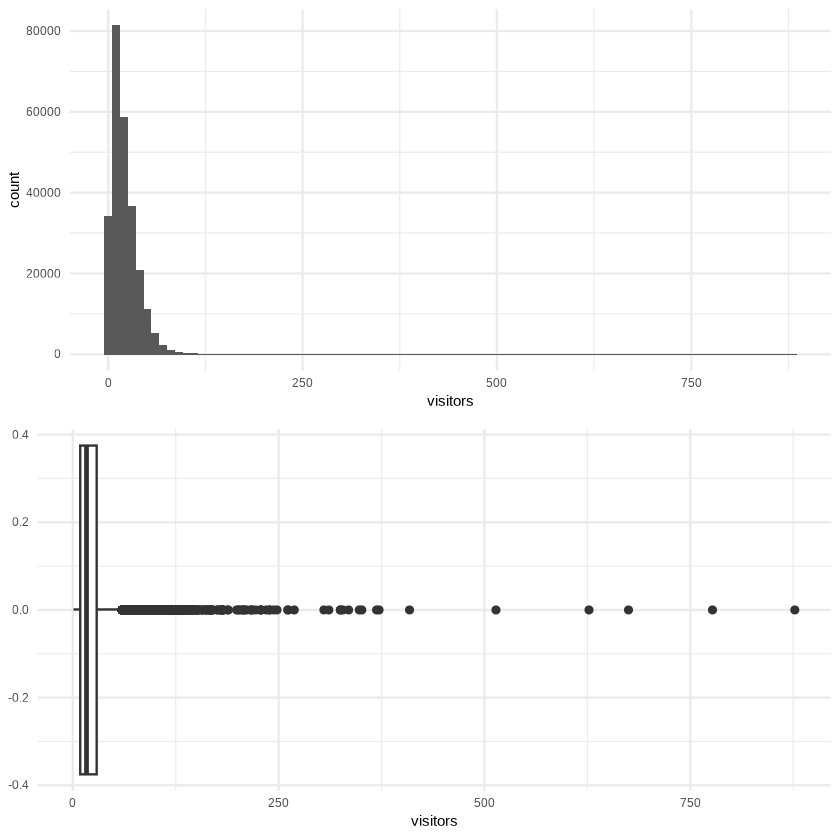

In [118]:
p1 <- ggplot(data = air_visit_data, aes(x = visitors)) +
geom_histogram(binwidth =10)+
theme_minimal()


p2 <- ggplot(data = air_visit_data, aes(x = visitors)) +
geom_boxplot() +
theme_minimal()

multiplot(p1, p2)

**Most air visitors range between 0 and 100 with some rare values beyond that, reaching ~ 800 visitors.**
Since the data is very wide and skewed we will apply log() to see how it effects the distibution.
>The reason for transforming the outcome variable is to make the distribution closer to a normal distribution, which is often an assumption in many statistical models, including linear regression models. When the outcome variable is not normally distributed, it can lead to biased parameter estimates and incorrect hypothesis testing results. In such cases, applying a logarithmic transformation can help to normalize the distribution and improve the accuracy of the model.
>However, it is important to note that log transformations may not always be appropriate or necessary for every dataset. It depends on the data and the specific problem you are trying to solve. 
It is essential to explore and understand the distribution of the outcome variable before deciding on the type of transformation to apply.

In summary, transforming the outcome variable using a logarithmic function can be helpful in certain situations, but it should not be done blindly. You should explore the data and consider other transformation methods, as well as their potential impact on the interpretation of the results.

Warning message in geom_histogram(binwith = 10):
"Ignoring unknown parameters: `binwith`"
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


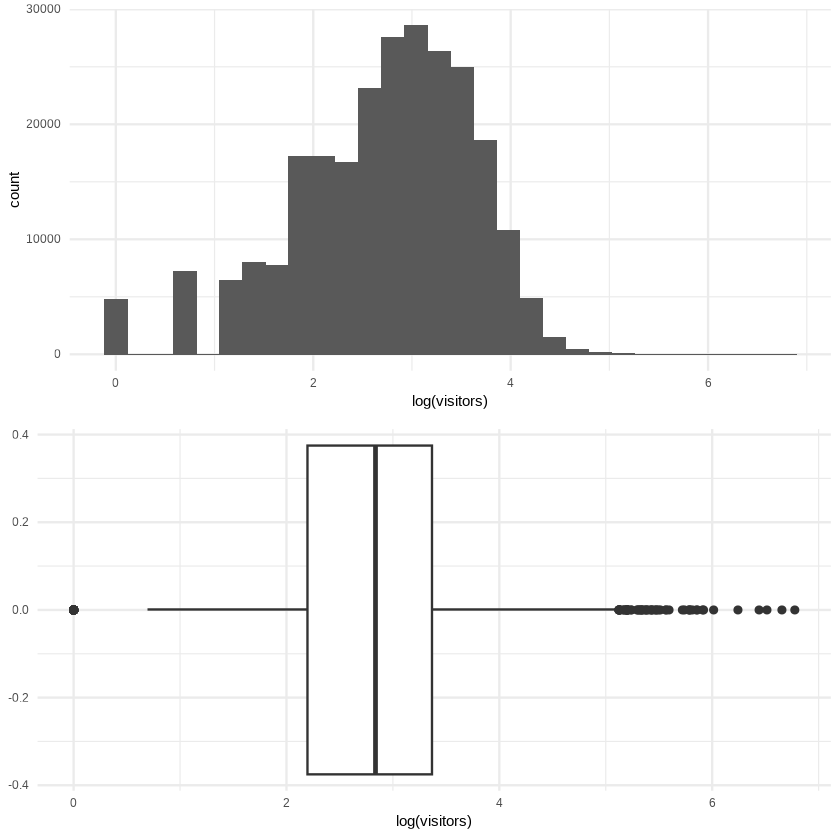

In [119]:
p1 <- ggplot(data = air_visit_data, aes(x = log(visitors))) +
geom_histogram(binwith = 10)+
theme_minimal()


p2 <- ggplot(data = air_visit_data, aes(x = log(visitors))) +
geom_boxplot() +
theme_minimal()

multiplot(p1, p2)

# gfg <-data.frame(x=rnorm(500))
  
# ggplot(gfg, aes(x)) +geom_histogram(aes(y = stat(density))) +  
# geom_density(col = "green")

The distrubution after log() transformations look more like normal distribusion.
* We will check which restaurants and dates have the most number of visitors and why! Maybe its a holiday, or a very famous and polular restaurant on a holiday.

Lets see how the dates are distributed:

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


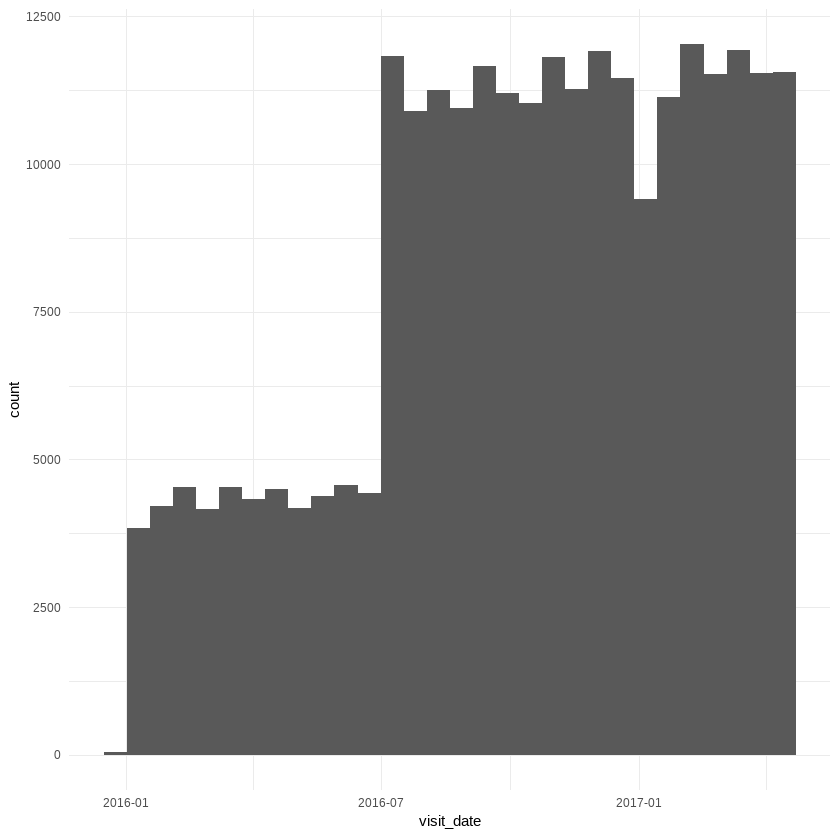

In [16]:
air_visit_data %>%
  ggplot(aes(visit_date)) +
  geom_histogram() +
  theme_minimal()

**Looks like the are more visit records after 2016-07**. This could be due to addition of more restaurants to the air system.
Let's see if the number of unique restaurants increased after 2016-06-30:

In [17]:
# Count the number of unique restaurant IDs before and after  2016-06-30
num_restaurants_before <- air_visit_data %>%
  filter(visit_date <= as.Date(" 2016-06-30")) %>%
  select(air_store_id) %>%
  distinct() %>%
  nrow()

num_restaurants_after <- air_visit_data %>%
  filter(visit_date > as.Date(" 2016-06-30")) %>%
  select(air_store_id) %>%
  distinct() %>%
  nrow()

# Print the results
cat("Number of restaurants before  2016-06-30:", num_restaurants_before, "\n")
cat("Number of restaurants after  2016-06-30:", num_restaurants_after, "\n")


Number of restaurants before  2016-06-30: 316 
Number of restaurants after  2016-06-30: 829 


In [41]:
# List the unique restaurant IDs before and after 2016-06-30 in air_visit_data
visit_restaurants_before <- air_visit_data %>%
  filter(visit_date <= as.Date("2016-06-30")) %>%
  select(air_store_id) %>%
  distinct() %>%
  pull() %>%
  unique()

visit_restaurants_after <- air_visit_data %>%
  filter(visit_date > as.Date("2016-06-30")) %>%
  select(air_store_id) %>%
  distinct() %>%
  pull() %>%
  unique()

In [42]:
#lets see how many common restaurants between the before and after 2016-06-30 in the data:
common_restaurants <- intersect(visit_restaurants_before, visit_restaurants_after)
num_common_restaurants <- length(common_restaurants)
num_common_restaurants

[1] 316

**Looks like there was an addition of 197 (513-316) new restaurants after 2016-06-30 like we assumed.**

Let's visualize the visitors by date, month and day of week:

In [18]:
#The distribution of total number of visitors per day
p1 <- air_visit_data %>%
  group_by(visit_date) %>%
  summarise(all_visitors = sum(visitors)) %>%
  ggplot(aes(x= visit_date, y= all_visitors)) +
  geom_line(col = "blue") +
  labs(x = "Date", y = "Visitore")


# The distribution of median number of visitors per week
p2 <- air_visit_data %>%
  mutate(wday = wday(visit_date, label = TRUE, week_start = 1)) %>%
  group_by(wday) %>%
  summarise(visits = median(visitors)) %>%
  ggplot(aes(wday, visits, fill = wday)) +
  geom_col() +
  theme(legend.position = "none", axis.text.x  = element_text(angle=45, hjust=1, vjust=0.9)) +
  labs(x = "Day of the week", y = "Median visitors") +
  scale_fill_hue()

# The distribution of median number of visitors per month  
p3 <- air_visit_data %>%
  mutate(month = month(visit_date, label = TRUE)) %>%
  group_by(month) %>%
  summarise(visits = median(visitors)) %>%
  ggplot(aes(month, visits, fill = month)) +
  geom_col() +
  theme(legend.position = "none") +
  labs(x = "Month", y = "Median visitors")

multiplot(p1, p2, p3)

ERROR: Error in multiplot(p1, p2, p3): could not find function "multiplot"


* Before 07/2016, the number of visitors ranged between 4000 and 8000. Starting from 07/2016, the number of visitors sharply increased and started ranging between 10000 and 23000. This is due to new restaurants being added to the data base. In addition, we see a periodic pattern that most likely corresponds to a weekly cycle.

* Without a surpirse, weekends see most number of visitors. The peak is on Saturdays.

* Also during the year there is a certain amount of variation. December appears to be the most popular month for restaurant visits. The period of Mar - May is consistently busy.

**let's visualze the visitor numbers for 2 month from April 15 to June 15 (dates that incule the dates in the test data for which we must predict (2017-04-23 until 2017-05-31):**

`geom_smooth()` using formula = 'y ~ x'


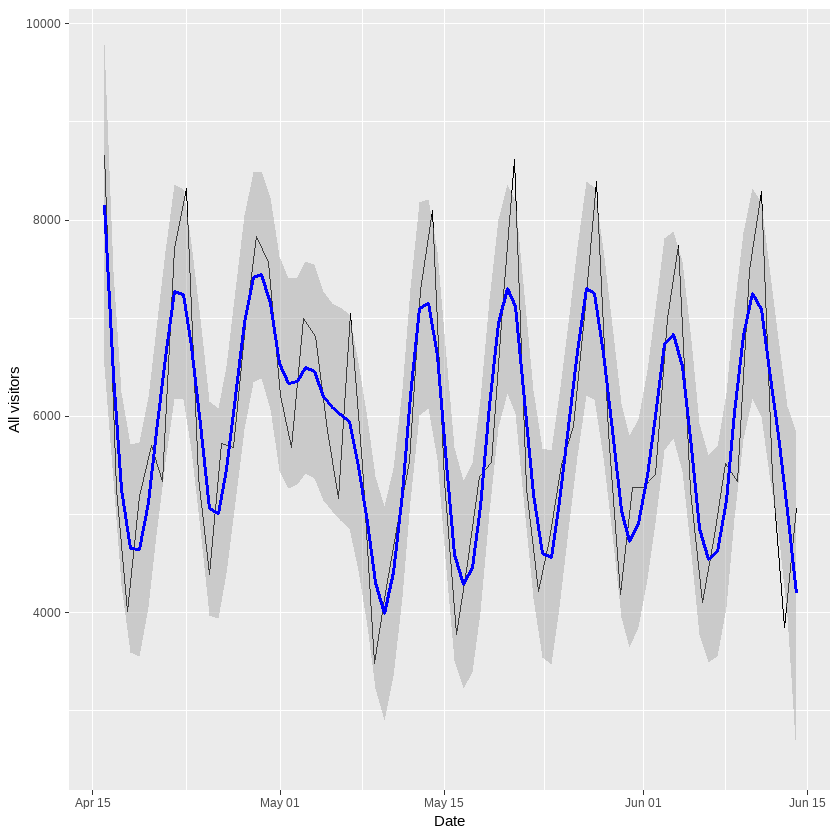

In [19]:
air_visit_data %>%
  filter(visit_date > ymd("2016-04-15") & visit_date < ymd("2016-06-15")) %>%
  group_by(visit_date) %>%
  summarise(all_visitors = sum(visitors)) %>%
  ggplot(aes(visit_date,all_visitors)) +
  geom_line() +
  geom_smooth(method = "loess", color = "blue", span = 1/7) +
  labs(y = "All visitors", x = "Date")

Here, the black line is the date and the blue line corresponds to a smoothing fit with a corresponding grey confidence area. We see the weekly period and also the impact of the aforementioned Golden Week, which in 2016 happened between Apr 29 and May 5.

**Let's visualise how many times each restaurant appears in the data:**

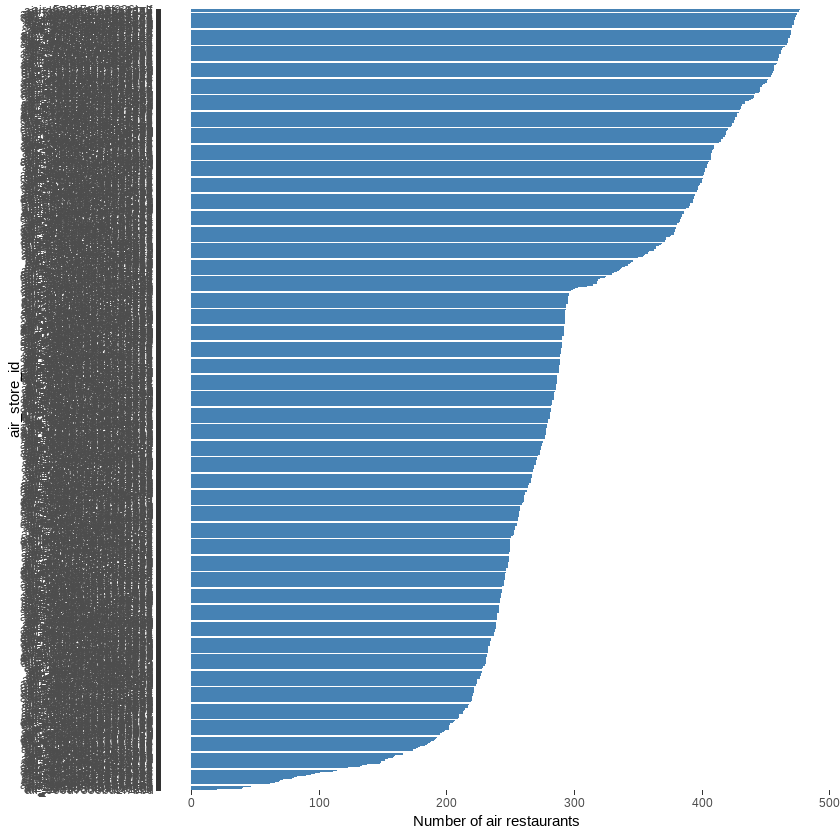

In [20]:
air_visit_data %>%
  group_by(air_store_id) %>%
  summarize(count = n()) %>%
  arrange(desc(count)) %>% 
  ggplot(aes(x = reorder(air_store_id, count), y = count)) +
  geom_bar(stat = "identity", fill = "steelblue") +
  coord_flip() +
  labs(x = "air_store_id", y = "Number of air restaurants")

In [21]:
#max and min numbers of restaurants:
air_visit_data %>%
        group_by(air_store_id) %>%
        tally() %>%
        summarize(max_count = max(n), min_count = min(n))

max_count,min_count
<int>,<int>
477,20


Some restaurants appear at max 477 times and some at min 20 times

**From this analysis we can conclude that the "outliers" are the values starting from 2016-07-01, the date where we saw an increase in the number of restaurants.**

**Let's explore reservations : `air_reserve.csv`**

In [22]:
air_reserve <- read.csv("C:/Users/stein/Documents/DataScience/Restaurant_Project/RestaurantDataBase/tables/air_reserve.csv")

In [23]:
head(air_reserve)

,air_store_id,visit_datetime,reserve_datetime,reserve_visitors
,<chr>,<chr>,<chr>,<int>
1,air_877f79706adbfb06,2016-01-01 19:00:00,2016-01-01 16:00:00,1
2,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,3
3,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,6
4,air_877f79706adbfb06,2016-01-01 20:00:00,2016-01-01 16:00:00,2
5,air_db80363d35f10926,2016-01-01 20:00:00,2016-01-01 01:00:00,5
6,air_db80363d35f10926,2016-01-02 01:00:00,2016-01-01 16:00:00,2


In [24]:
# the visit_datetime and reserve_dateime are 'characters'
# let's set them as datetime variables:
air_reserve$visit_datetime <- ymd_hms(air_reserve$visit_datetime)
air_reserve$reserve_datetime <- ymd_hms(air_reserve$reserve_datetime)

In [25]:
summary(air_reserve)
summary(air_reserve$reserve_visitors)

 air_store_id       visit_datetime                reserve_datetime             
 Length:92378       Min.   :2016-01-01 19:00:00   Min.   :2016-01-01 01:00:00  
 Class :character   1st Qu.:2016-11-15 19:00:00   1st Qu.:2016-11-07 17:00:00  
 Mode  :character   Median :2017-01-05 18:00:00   Median :2016-12-27 22:00:00  
                    Mean   :2016-12-05 08:18:58   Mean   :2016-11-27 01:13:07  
                    3rd Qu.:2017-03-03 19:00:00   3rd Qu.:2017-02-26 18:00:00  
                    Max.   :2017-05-31 21:00:00   Max.   :2017-04-22 23:00:00  
 reserve_visitors 
 Min.   :  1.000  
 1st Qu.:  2.000  
 Median :  3.000  
 Mean   :  4.482  
 3rd Qu.:  5.000  
 Max.   :100.000  

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   2.000   3.000   4.482   5.000 100.000 

In [26]:
diagnose(air_reserve)

variables,types,missing_count,missing_percent,unique_count,unique_rate
<chr>,<chr>,<int>,<dbl>,<int>,<dbl>
air_store_id,character,0,0,314,0.0033990777
visit_datetime,POSIXct,0,0,4975,0.0538548139
reserve_datetime,POSIXct,0,0,7513,0.0813288878
reserve_visitors,integer,0,0,71,0.0007685813


* visit_datetime from 2016-01-01 to 2017-05-31 (train +test times)
* there's only 314 restaurants in this file
* 92378 records
* the mean is 4.482 and the medain is 3 while the max number of reserved visitors is 100

**Let's visualise the distribution of reserved_visitors:**

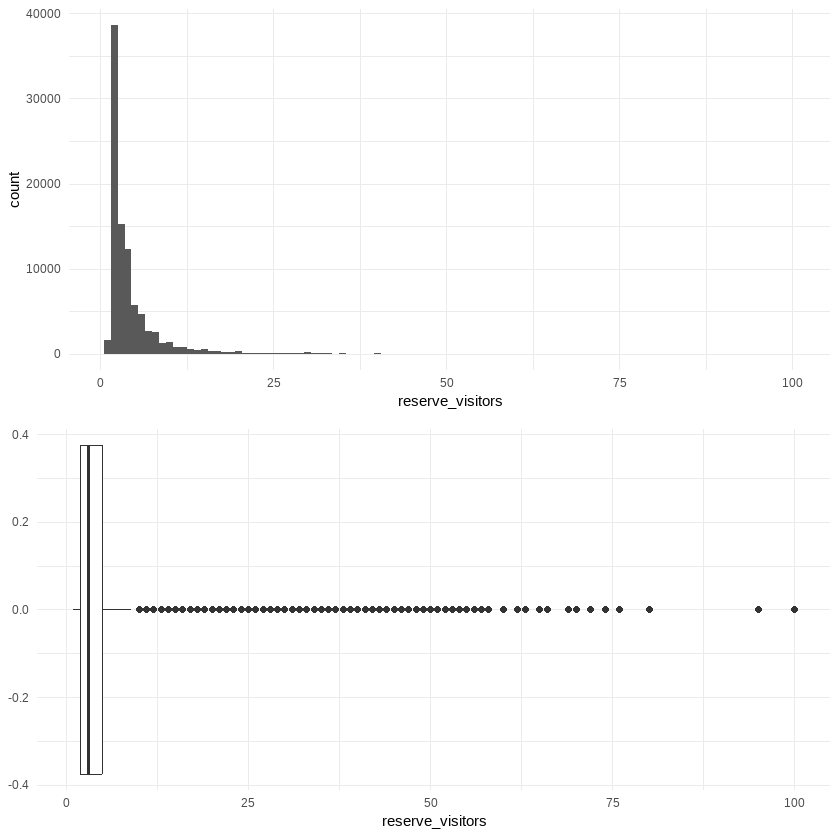

In [30]:
p1 <- ggplot(data = air_reserve, aes(x = reserve_visitors)) +
geom_histogram(binwidth = 1)+
theme_minimal()


p2 <- ggplot(data = air_reserve, aes(x = reserve_visitors)) +
geom_boxplot() +
theme_minimal()

multiplot(p1, p2)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


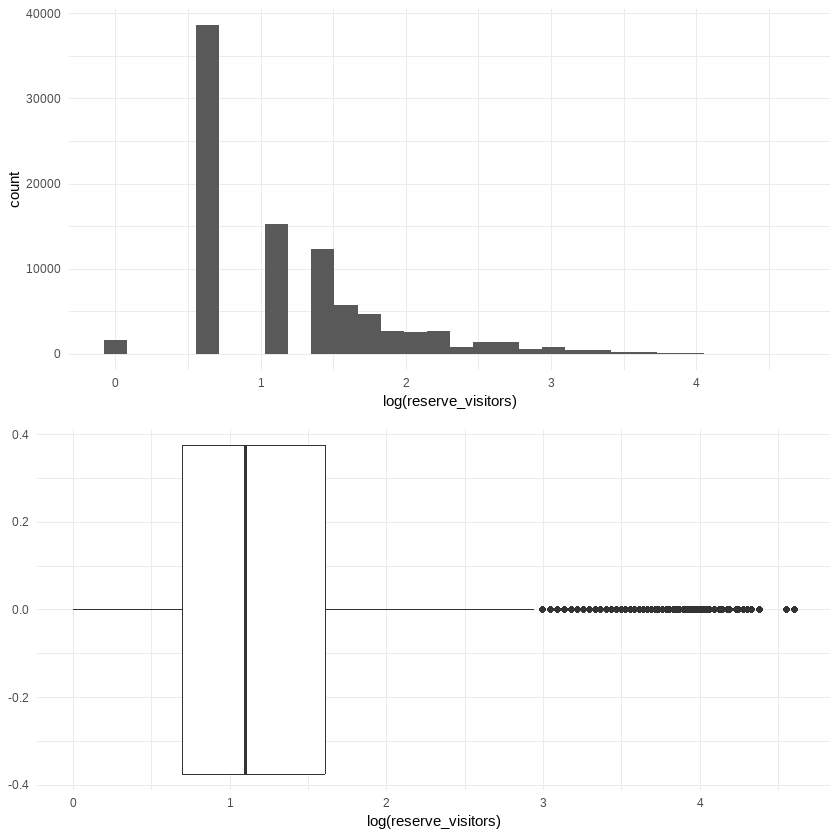

In [31]:
#lets see it with log()
p1 <- ggplot(data = air_reserve, aes(x = log(reserve_visitors))) +
geom_histogram()+
theme_minimal()


p2 <- ggplot(data = air_reserve, aes(x = log(reserve_visitors))) +
geom_boxplot() +
theme_minimal()

multiplot(p1, p2)


Still doesn't look like a normal distribution

**Let's visualize the `reserve_visotors` by date, month and hours:**

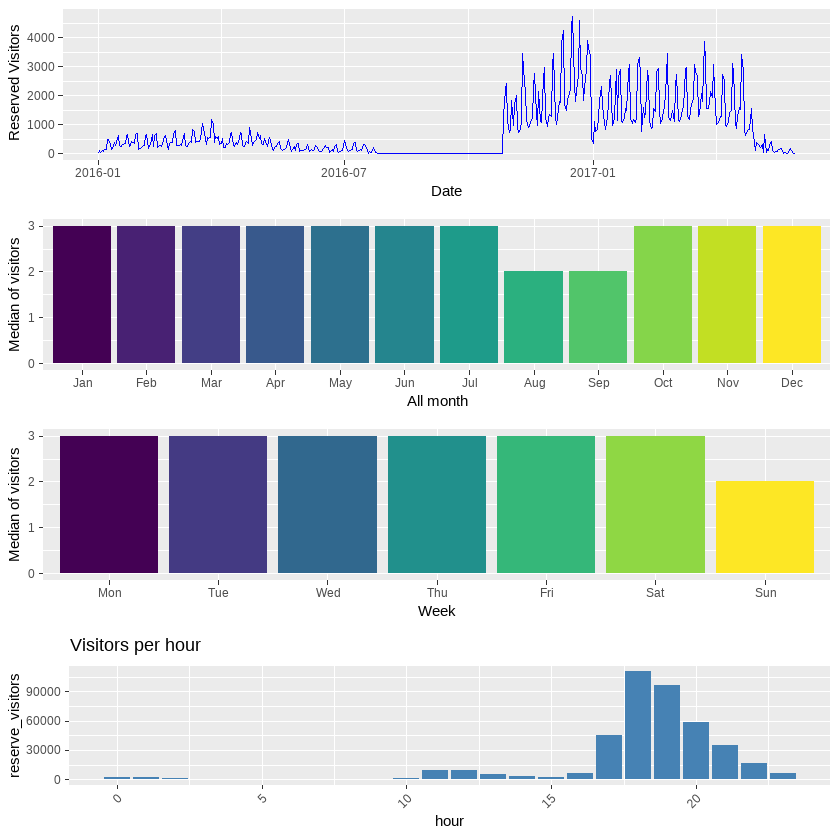

In [32]:
p1 <- air_reserve %>%
  group_by(date = date(visit_datetime)) %>%
  summarise(visitors = sum(reserve_visitors)) %>%
  ggplot(aes(x = date, y = visitors)) +
  geom_line(col = "blue") +
  labs(y = " Reserved Visitors", x = "Date") 

p2 <- air_reserve %>%
    mutate(month = month(visit_datetime, label = TRUE)) %>%
    group_by(month) %>%
    summarise(visits = median(reserve_visitors)) %>%
    ggplot(aes(x = month, y = visits, fill = month)) +
    geom_col() +
    theme(legend.position = "none") +
    labs(x = "All month", y = "Median of visitors")


p3 <- air_reserve %>%
    mutate(wday = wday(visit_datetime, label = TRUE, week_start = 1)) %>%
    group_by(wday) %>%
    summarise(sum_visitors = median(reserve_visitors)) %>%
    ggplot(aes(x = wday, y = sum_visitors, fill = wday)) +
    geom_col() +
    theme(legend.position = "none")+
    labs(x = "Week", y = "Median of visitors")

p4 <- air_reserve %>%
  mutate(hour = lubridate::hour(visit_datetime)) %>%
  group_by(hour) %>%
  summarise(reserve_visitors = sum(reserve_visitors)) %>%
  arrange(reserve_visitors) %>%
  ggplot(aes(x = hour, y = reserve_visitors)) +
  geom_col(fill = "steelblue") +
  labs(title = "Visitors per hour") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

multiplot(p1,p2, p3,p4)

* We can see a deep in visitors during August and September 2016 and a rapid decline towards the tail of the line-graph.
* The number of visiors from January 2016 until mid July 2016 are signifiacntly lower compared to October 2016 until May 2017.
* The very low number of reserved visitors during August and September 2016 is very strange. We saw earlier in the air_visit_data that the're a significant increase in the number of visitors after 01-07-2016..
* We can see that the evenings are the bussiest, the peak of visits is at 18. Low number of reservastions for early mornings is reasable. 
* top graph - We can see again the cyclic pattern, it is probably the 7 weekdays.

let's zoom in to the period of dramatic increase in reserved_visitors:

In [33]:
air_reserve$visit_date <- date(air_reserve$visit_datetime)

In [34]:
head(air_reserve,1)

,air_store_id,visit_datetime,reserve_datetime,reserve_visitors,visit_date
,<chr>,<dttm>,<dttm>,<int>,<date>
1,air_877f79706adbfb06,2016-01-01 19:00:00,2016-01-01 16:00:00,1,2016-01-01


**let's visualze the reserved visitor numbers for 2 month from April 15 to June 15 (dates that incule the dates in the test data for which we must predict (2017-04-23 until 2017-05-31):**

`geom_smooth()` using formula = 'y ~ x'


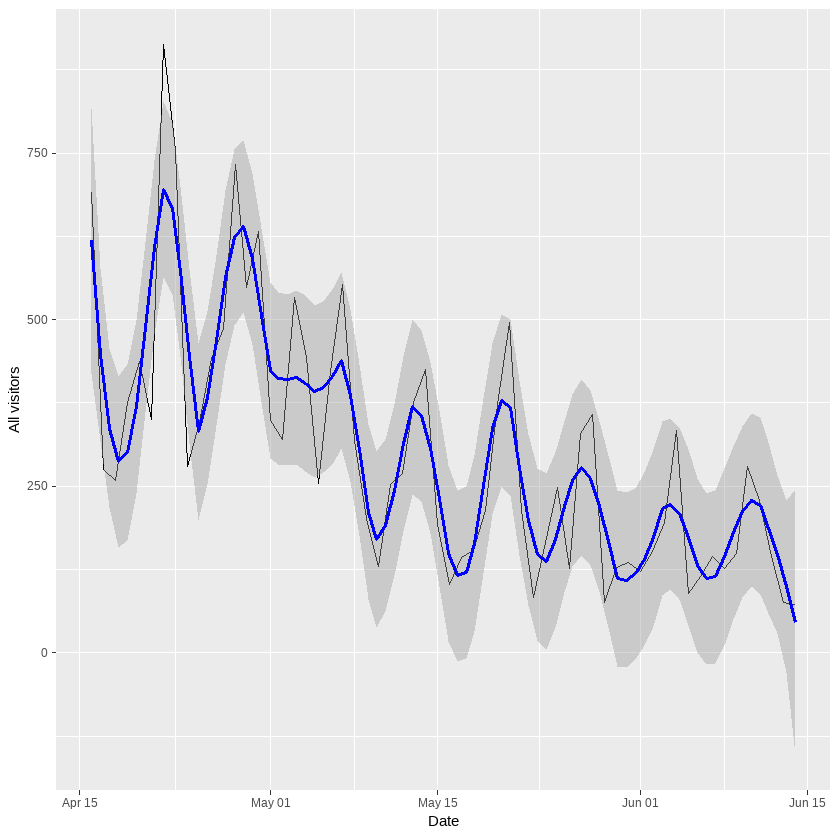

In [35]:
air_reserve %>%
  filter(visit_date > ymd("2016-04-15") & visit_date < ymd("2016-06-15")) %>%
  group_by(visit_date) %>%
  summarise(all_res_visitors = sum(reserve_visitors)) %>%
  ggplot(aes(visit_date,all_res_visitors)) +
  geom_line() +
  geom_smooth(method = "loess", color = "blue", span = 1/7) +
  labs(y = "All visitors", x = "Date")

We can see a decline in the number of reserved visitors, weekly cycles and the Golden Week.

**Let's observe whether the addition of new restaurants to the Air system has an impact on the reservations data:**

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


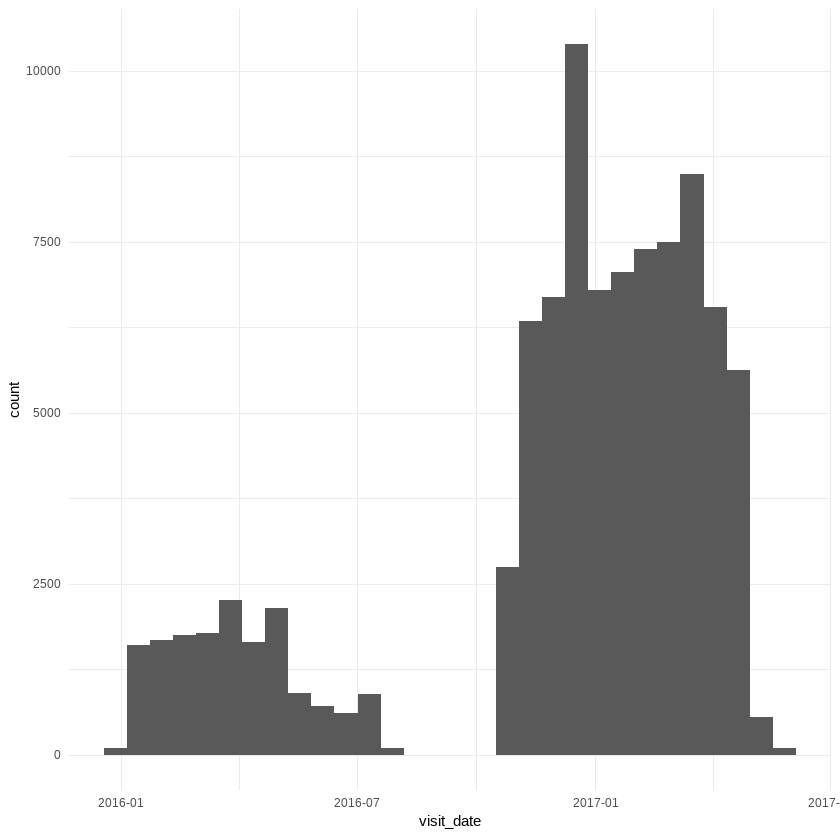

In [36]:
air_reserve %>%
  ggplot(aes(visit_date)) +
  geom_histogram() +
  theme_minimal()

* we can see a deep in around months 8 - 9. 
* also, there's more records after month 10.

In [37]:
# Count the number of unique restaurant IDs before and after 2016-06-30
num_restaurants_before <- air_reserve %>%
  filter(visit_date <= as.Date("2016-06-30")) %>%
  select(air_store_id) %>%
  distinct() %>%
  nrow()

num_restaurants_after <- air_reserve %>%
  filter(visit_date > as.Date("2016-06-30")) %>%
  select(air_store_id) %>%
  distinct() %>%
  nrow()

# Print the results
cat("Number of restaurants before 2016-10-26:", num_restaurants_before, "\n")
cat("Number of restaurants after 2016-10-26:", num_restaurants_after, "\n")

Number of restaurants before 2016-10-26: 90 
Number of restaurants after 2016-10-26: 308 


In [38]:
# List the unique restaurant IDs before and after 2016-10-26 in air_reserved_data data
restaurants_before <- air_reserve %>%
  filter(visit_date <= as.Date("2016-06-30")) %>%
  select(air_store_id) %>%
  distinct() %>%
  pull() %>%
  unique()

restaurants_after <- air_reserve %>%
  filter(visit_date > as.Date("2016-06-30")) %>%
  select(air_store_id) %>%
  distinct() %>%
  pull() %>%
  unique()

# List the unique restaurant IDs before and after 2016-06-30 in air_visit_data
visit_restaurants_before <- air_visit_data %>%
  filter(visit_date <= as.Date("2016-06-30")) %>%
  select(air_store_id) %>%
  distinct() %>%
  pull() %>%
  unique()

visit_restaurants_after <- air_visit_data %>%
  filter(visit_date > as.Date("2016-06-30")) %>%
  select(air_store_id) %>%
  distinct() %>%
  pull() %>%
  unique()

In [39]:
#count have many restaurants are in commen between the added restaurants in air_visit and air_reserve:
common_restaurants <- intersect(restaurants_after, visit_restaurants_after)
num_common_restaurants <- length(common_restaurants)
num_common_restaurants

[1] 308

In [40]:
#lets see how many common restaurants between the before and after 2016-10-26 in the reservations data:
common_restaurants <- intersect(restaurants_before, restaurants_after)
num_common_restaurants <- length(common_restaurants)
num_common_restaurants

[1] 84

**Here as well we see the effect of addition of new restaurants to the AirRegi system**

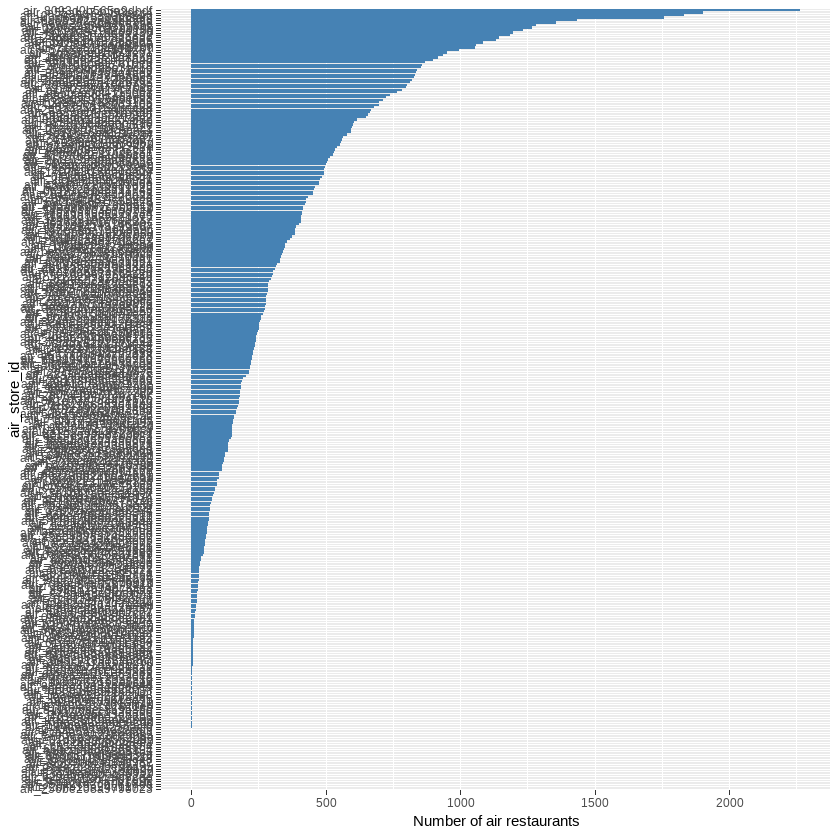

In [43]:
air_reserve %>%
  group_by(air_store_id) %>%
  summarize(count = n()) %>%
  arrange(desc(count)) %>% 
  ggplot(aes(x = reorder(air_store_id, count), y = count)) +
  geom_bar(stat = "identity", fill = "steelblue") +
  coord_flip() +
  labs(x = "air_store_id", y = "Number of air restaurants")

In [44]:
#max and min numbers of restaurants:
air_reserve %>%
        group_by(air_store_id) %>%
        tally() %>%
        summarize(max_count = max(n), min_count = min(n))

max_count,min_count
<int>,<int>
2263,1


**hpg_reserve.csv**

In [128]:
hpg_reserve <- read.csv("C:/Users/stein/Documents/DataScience/Restaurant_Project/RestaurantDataBase/tables/hpg_reserve.csv")

In [129]:
head(hpg_reserve)

,hpg_store_id,visit_datetime,reserve_datetime,reserve_visitors
,<chr>,<chr>,<chr>,<int>
1,hpg_c63f6f42e088e50f,2016-01-01 11:00:00,2016-01-01 09:00:00,1
2,hpg_dac72789163a3f47,2016-01-01 13:00:00,2016-01-01 06:00:00,3
3,hpg_c8e24dcf51ca1eb5,2016-01-01 16:00:00,2016-01-01 14:00:00,2
4,hpg_24bb207e5fd49d4a,2016-01-01 17:00:00,2016-01-01 11:00:00,5
5,hpg_25291c542ebb3bc2,2016-01-01 17:00:00,2016-01-01 03:00:00,13
6,hpg_28bdf7a336ec6a7b,2016-01-01 17:00:00,2016-01-01 15:00:00,2


In [130]:
#convert datetime
hpg_reserve$visit_datetime <- ymd_hms(hpg_reserve$visit_datetime)
hpg_reserve$reserve_datetime <- ymd_hms(hpg_reserve$reserve_datetime)

In [131]:
summary(hpg_reserve)
diagnose(hpg_reserve)
summary(hpg_reserve$reserve_visitors)

 hpg_store_id       visit_datetime                reserve_datetime             
 Length:2000320     Min.   :2016-01-01 11:00:00   Min.   :2016-01-01 00:00:00  
 Class :character   1st Qu.:2016-06-26 19:00:00   1st Qu.:2016-06-21 12:00:00  
 Mode  :character   Median :2016-11-19 20:00:00   Median :2016-11-10 20:00:00  
                    Mean   :2016-10-15 06:55:20   Mean   :2016-10-07 19:57:59  
                    3rd Qu.:2017-02-03 19:00:00   3rd Qu.:2017-01-27 13:00:00  
                    Max.   :2017-05-31 23:00:00   Max.   :2017-04-22 23:00:00  
 reserve_visitors 
 Min.   :  1.000  
 1st Qu.:  2.000  
 Median :  3.000  
 Mean   :  5.074  
 3rd Qu.:  6.000  
 Max.   :100.000  

variables,types,missing_count,missing_percent,unique_count,unique_rate
<chr>,<chr>,<int>,<dbl>,<int>,<dbl>
hpg_store_id,character,0,0,13325,6.661434e-03
visit_datetime,POSIXct,0,0,9847,4.922712e-03
reserve_datetime,POSIXct,0,0,11450,5.724084e-03
reserve_visitors,integer,0,0,99,4.949208e-05


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   2.000   3.000   5.074   6.000 100.000 

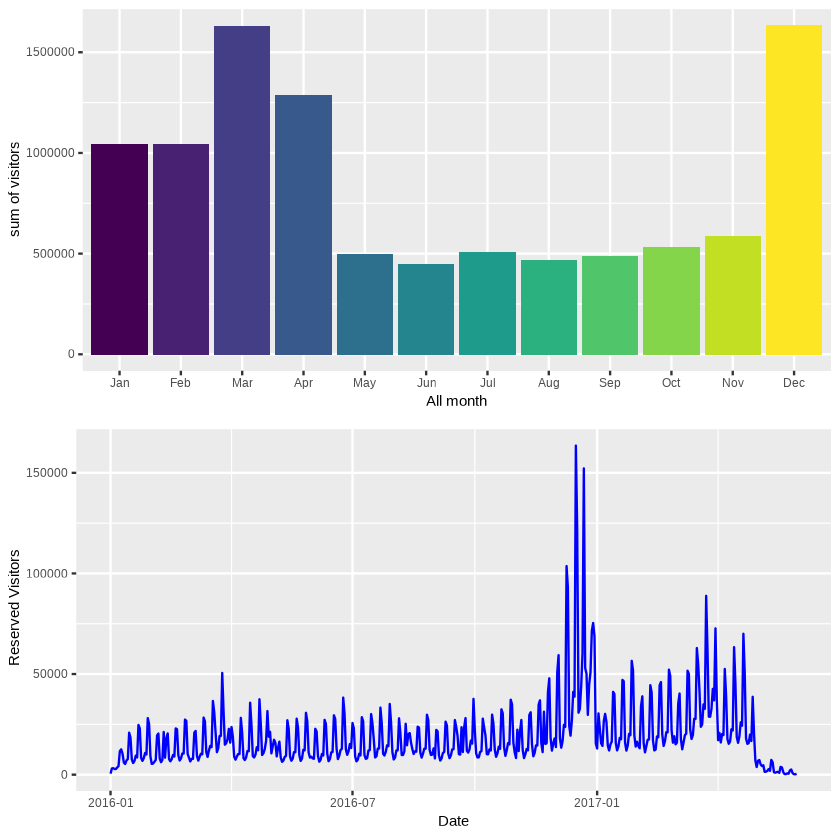

In [132]:
p1 <- hpg_reserve %>%
    mutate(month = month(visit_datetime, label = TRUE)) %>%
    group_by(month) %>%
    summarise(sum_visitors = sum(reserve_visitors)) %>%
    ggplot(aes(x = month, y = sum_visitors, fill = month)) +
    geom_col() +
    theme(legend.position = "none") +
    labs(x = "All month", y = "sum of visitors")


p3 <- hpg_reserve %>%
  group_by(date = date(visit_datetime)) %>%
  summarise(visitors = sum(reserve_visitors)) %>%
  ggplot(aes(x = date, y = visitors)) +
  geom_line(col = "blue") +
  labs(y = " Reserved Visitors", x = "Date")

multiplot(p1,p3)

* We see that there are more restaurants than the air_reserve: 2,000,320  observations and 13,325 unique hpg_store_ids
* visit_datetime spans from 2016-01-01 to 2017-05-31
* No NA's
* Max reserve_vistors is 100
* The month 3,4 and 12 were with most number of reservations and visitors.
* In contract with air_reserve - month July and August have normal number of reservations.
* There is dramaric increase in reservations in the end of year 2016.
* The end of the data set the reservation drop to almost 0.

`store_id_relation.csv`

In [133]:
store_id_relation <- read.csv("C:/Users/stein/Documents/DataScience/Restaurant_Project/RestaurantDataBase/tables/store_id_relation.csv")

In [134]:
head(store_id_relation)

,air_store_id,hpg_store_id
,<chr>,<chr>
1,air_63b13c56b7201bd9,hpg_4bc649e72e2a239a
2,air_a24bf50c3e90d583,hpg_c34b496d0305a809
3,air_c7f78b4f3cba33ff,hpg_cd8ae0d9bbd58ff9
4,air_947eb2cae4f3e8f2,hpg_de24ea49dc25d6b8
5,air_965b2e0cf4119003,hpg_653238a84804d8e7
6,air_a38f25e3399d1b25,hpg_50378da9ffb9b6cd


In [135]:
summary(store_id_relation)

 air_store_id       hpg_store_id      
 Length:150         Length:150        
 Class :character   Class :character  
 Mode  :character   Mode  :character  

**There are only 150 restaurants.
Since we will using only the air restaurant data, lets enrich the air_reserve with  hpg_reserve data using the store_id_relation table:**


In [136]:
#inner join of hpg_reserve and store_id_relation
#here we will have only the data where an hpg restaurant has a record in air restaurants 
hpg_reserve_with_air_id <- merge(x = hpg_reserve, y = store_id_relation, by = "hpg_store_id")

In [138]:
length(unique(hpg_reserve_with_air_id$hpg_store_id))
       
length(hpg_reserve_with_air_id$hpg_store_id)

[1] 150

[1] 28183

**We have declined from 2,000,320 observations to 28,183 observations in "hpg_reserve", and 150 unique IDs as expected.**

In [139]:
#let's delete the hpg_store_id column
hpg_reserve_with_air_id <- select(hpg_reserve_with_air_id, -hpg_store_id)

In [142]:
##add visit_date like we did in air_reserve:
hpg_reserve_with_air_id$visit_date <- date(hpg_reserve_with_air_id$visit_datetime)

In [143]:
head(hpg_reserve_with_air_id)

,visit_datetime,reserve_datetime,reserve_visitors,air_store_id,visit_date
,<dttm>,<dttm>,<int>,<chr>,<date>
1,2017-03-10 19:00:00,2017-03-10 10:00:00,2,air_cbe867adcf44e14f,2017-03-10
2,2017-03-17 19:00:00,2017-03-11 04:00:00,2,air_cbe867adcf44e14f,2017-03-17
3,2016-01-15 19:00:00,2016-01-13 12:00:00,8,air_cbe867adcf44e14f,2016-01-15
4,2016-02-28 19:00:00,2016-02-21 07:00:00,5,air_cbe867adcf44e14f,2016-02-28
5,2017-04-14 18:00:00,2017-04-10 06:00:00,2,air_cbe867adcf44e14f,2017-04-14
6,2017-03-18 18:00:00,2017-03-13 01:00:00,3,air_cbe867adcf44e14f,2017-03-18


In [144]:
#Adding to the data from air_reserve and hpg_reserve_with_air_id:
air_reserved_data <- rbind(air_reserve, hpg_reserve_with_air_id)

In [145]:
length(unique(air_reserved_data$air_store_id))
length(air_reserved_data$air_store_id)


[1] 333

[1] 120561

In [146]:
length(air_reserve$air_store_id)

[1] 92378

**This means we have enriched the reservation data from 314 unique ID to 333 and the records from 92378 to 120561.**

# 2. Merging tables to create a full dataset




In [57]:
#first we will add the store info to the train set:  by LEFT JOIN
full_data <- merge(air_visit_data, air_store_info, by = "air_store_id", all.x = TRUE )

In [58]:
length(full_data$air_store_id)

[1] 252108

In [59]:
# lets add the date_info (day of week and if its holiday or not) by LEFT JOIN
full_data <- merge(full_data, date_info, by = "visit_date", all.x = TRUE)

In [60]:
head(full_data)

,visit_date,air_store_id,visitors,air_genre_name,air_area_name,latitude,longitude,day_of_week,holiday_flg
,<date>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<int>
1,2016-01-01,air_b2d8bc9c88b85f96,16,Dining bar,Fukuoka-ken Fukuoka-shi Tenjin,33.59021,130.3977,Friday,1
2,2016-01-01,air_d0a1e69685259c92,7,Creative cuisine,TÅkyÅ-to Shinjuku-ku KabukichÅ,35.69384,139.7035,Friday,1
3,2016-01-01,air_506fe758114df773,4,Italian/French,TÅkyÅ-to Setagaya-ku Setagaya,35.64657,139.6532,Friday,1
4,2016-01-01,air_efc80d3f96b3aff7,10,Other,TÅkyÅ-to Suginami-ku Asagayaminami,35.69957,139.6364,Friday,1
5,2016-01-01,air_d0e8a085d8dc83aa,8,Cafe/Sweets,HyÅgo-ken KÅbe-shi Sumiyoshi Higashimachi,34.72023,135.2655,Friday,1
6,2016-01-01,air_f26f36ec4dc5adb0,64,Izakaya,TÅkyÅ-to Shinjuku-ku KabukichÅ,35.69384,139.7035,Friday,1


# Making visualizations in the full_data:

In [61]:
#categorize date:
full_data$air_store_id <- as.factor(full_data$air_store_id)
full_data$air_genre_name <- as.factor(full_data$air_genre_name)
full_data$air_area_name <- as.factor(full_data$air_area_name)
full_data$day_of_week <- as.factor(full_data$day_of_week)
full_data$holiday_flg <- as.factor(full_data$holiday_flg)

In [62]:
summary(full_data)

   visit_date                       air_store_id       visitors     
 Min.   :2016-01-01   air_5c817ef28f236bdf:   477   Min.   :  1.00  
 1st Qu.:2016-07-23   air_36bcf77d3382d36e:   476   1st Qu.:  9.00  
 Median :2016-10-23   air_a083834e7ffe187e:   476   Median : 17.00  
 Mean   :2016-10-12   air_d97dabf7aae60da5:   476   Mean   : 20.97  
 3rd Qu.:2017-01-24   air_232dcee6f7c51d37:   475   3rd Qu.: 29.00  
 Max.   :2017-04-22   air_60a7057184ec7ec7:   475   Max.   :877.00  
                      (Other)             :249253                   
        air_genre_name                            air_area_name   
 Izakaya       :62052   Fukuoka-ken Fukuoka-shi DaimyÅ\215  : 19775  
 Cafe/Sweets   :52764   TÅ\215kyÅ\215-to Shibuya-ku Shibuya    : 17352  
 Dining bar    :34192   TÅ\215kyÅ\215-to Minato-ku ShibakÅ\215en  : 14696  
 Italian/French:30011   TÅ\215kyÅ\215-to Shinjuku-ku KabukichÅ\215: 12517  
 Bar/Cocktail  :25135   TÅ\215kyÅ\215-to Setagaya-ku Setagaya  :  8719  
 Japanese foo

**Next, we plot the numbers of different types of cuisine (or air_genre_names) alongside the areas with the most air restaurants:**

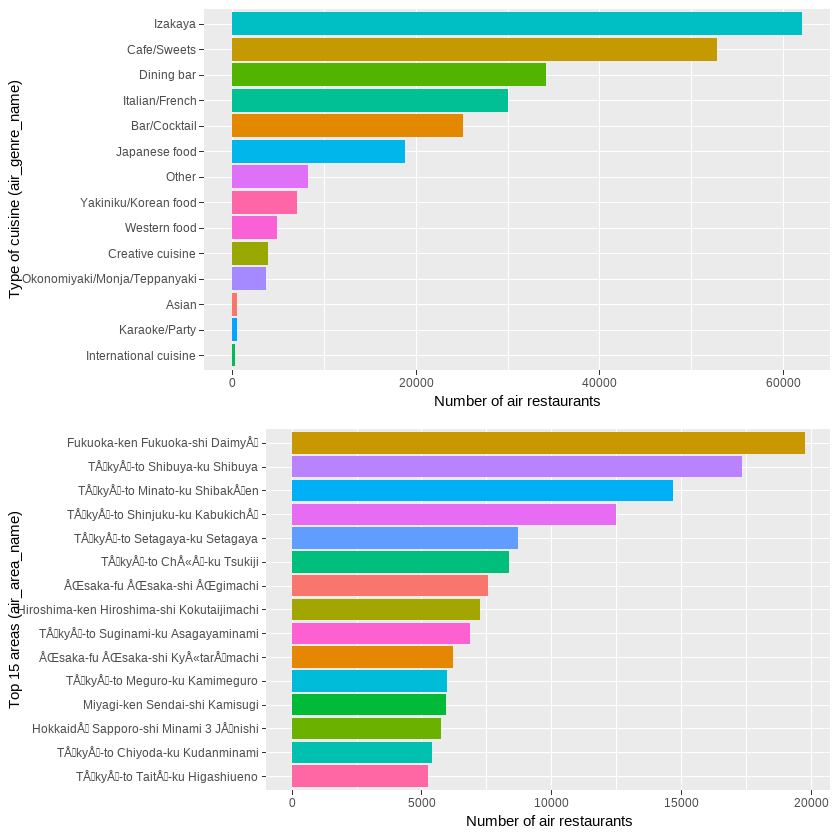

In [63]:
#the most common types of cuisine
p1 <- full_data %>%
  group_by(air_genre_name) %>%
  count() %>%
  ggplot(aes(reorder(air_genre_name, n, FUN = min), n, fill = air_genre_name)) +
  geom_col() +
  coord_flip() +
  theme(legend.position = "none") +
  labs(x = "Type of cuisine (air_genre_name)", y = "Number of air restaurants")

#the top 15 areas:
p2 <- full_data %>%
  group_by(air_area_name) %>%
  count() %>%
  ungroup() %>%
  top_n(15,n) %>%
  ggplot(aes(reorder(air_area_name, n, FUN = min) ,n, fill = air_area_name)) +
  geom_col() +
  theme(legend.position = "none") +
  coord_flip() +
  labs(x = "Top 15 areas (air_area_name)", y = "Number of air restaurants")

layout <- matrix(c(1,2),2,1,byrow=TRUE)
multiplot(p1, p2, layout=layout)

#open the image in a new tap to see it more clearly

We find:

* There are lots of Izakaya restaurants in our data, followed by Cafe’s. We don’t have many Karaoke “International” or “Asian”.

* Fukuoka has the largest number of air restaurants per area, followed by many Tokyo areas.

Now let's look at the spatial information. Note, that according to the data description the “latitude and longitude are the latitude and longitude of the area to which the store belongs”. This is meant to discourage us from identifying specific restaurants.

This is a fully interactive and zoomable map of all the air restaurants. Click on the clusters to break them up into smaller clusters and ultimately into the individual restaurants, which are labelled by their genre. The map nicely visualises the fact that many restaurants share common coordinates, since those coordinates refer to the area of the restaurant. Click on the single markers to see their air_store_id. The map is powered by the leaflet package, which includes a variety of cool tools for interactive maps.

In [127]:
leaflet(full_data) %>%
  addTiles() %>%
  addProviderTiles("CartoDB.Positron") %>%
  addMarkers(~longitude, ~latitude,
             popup = ~air_store_id, label = ~air_genre_name,
             clusterOptions = markerClusterOptions())

HTML widgets cannot be represented in plain text (need html)

Let’s plot how many holidays there are in total and also how they are distributed during our prediction time range in 2017 and the corresponding time in 2016:

We will be predicting for the last week of April plus May 2017, so let’s look at this time range in our 2016 training data:

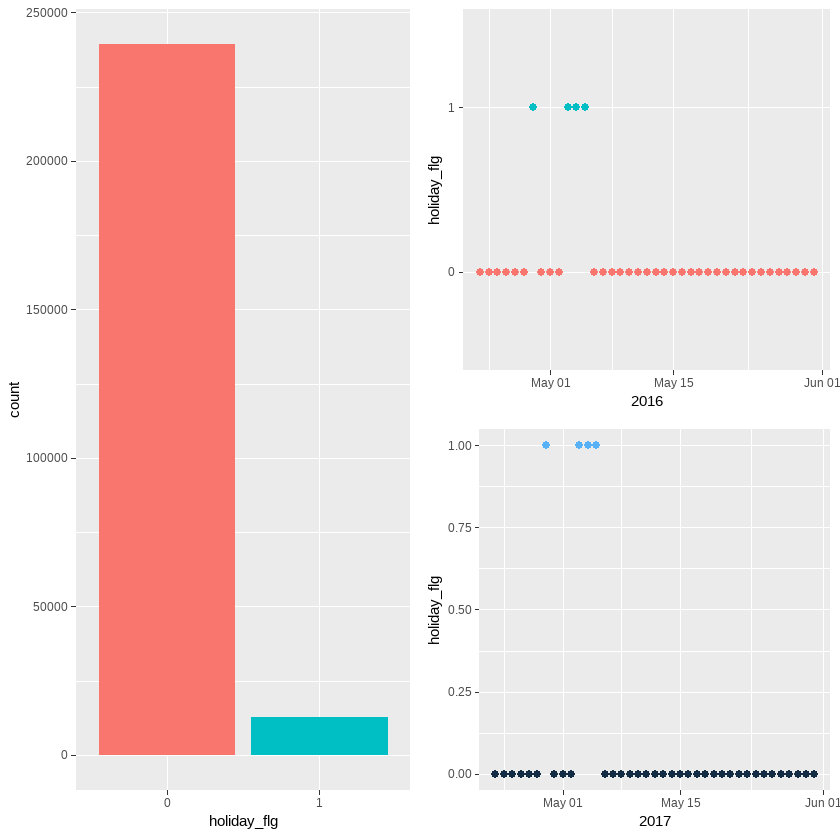

In [64]:
p1 <- full_data %>%
  ggplot(aes(holiday_flg, fill = holiday_flg)) +
  geom_bar() +
  theme(legend.position = "none")
  
p2 <- full_data %>%
  filter(visit_date > ymd("2016-04-22") & visit_date < ymd("2016-06-01")) %>%
  ggplot(aes(visit_date, holiday_flg, color = holiday_flg)) +
  geom_point(size = 2) +
  theme(legend.position = "none") +
  labs(x = "2016")

p3 <- date_info %>%
  filter(visit_date > ymd("2017-04-22") & visit_date < ymd("2017-06-01")) %>%
  ggplot(aes(visit_date, holiday_flg, color = holiday_flg)) +
  geom_point(size = 2) +
  theme(legend.position = "none") +
  labs(x = "2017")

layout <- matrix(c(1,1,2,3),2,2,byrow=FALSE)
multiplot(p1, p2, p3, layout=layout)

The last table looks like that because i did not convert the holiday_flg to factor in the original dataset "date_info"

### 3.1 Visitors per genre
Our first plot of the multi-feature space deals with the average number of air restaurant visitors broken down by type of cuisine; i.e. the air_genre_name. We use a facet plot to distinguish the time series for the 14 categories. Note the logarithmic y-axis:

`summarise()` has grouped output by 'visit_date'. You can override using the
`.groups` argument.


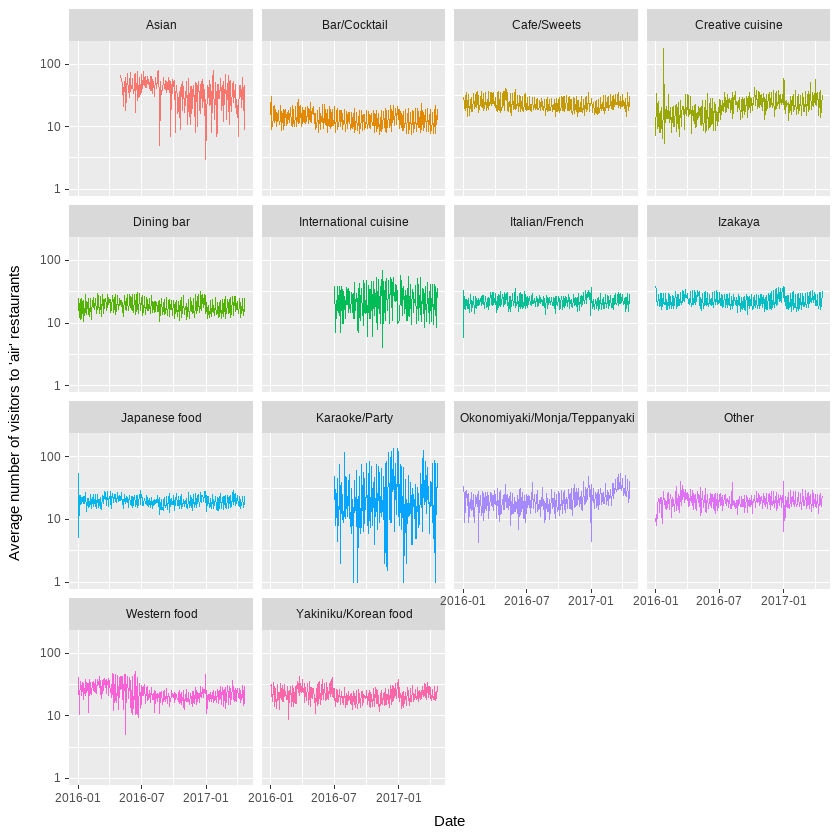

In [65]:
p1 <- full_data %>%
  group_by(visit_date, air_genre_name) %>%
  summarise(mean_visitors = mean(visitors)) %>%
  ungroup() %>% 
  ggplot(aes(visit_date, mean_visitors, color = air_genre_name)) +
  geom_line() +
  labs(y = "Average number of visitors to 'air' restaurants", x = "Date") +
  theme(legend.position = "none") +
  scale_y_log10() +
  facet_wrap(~ air_genre_name)

#By using ungroup() before creating the ggplot visualization,
#the code ensures that the mean number of visitors is calculated across
#the entire data set, rather than separately for each air_genre_name group, which is necessary for accurate plotting.

p1

We find:

* The mean values range between 10 and 100 visitors per genre per day. Within each category, the long-term trend looks reasonably stable. There is an upward trend for “Creative Cuisine” and “Okonomiyaki” , while the popularity of “Asian” food has been declining since late 2016.

* The low-count time series like “Karaoke” or “Asian” (see earlier) are understandably more noisy than the genres with higher numbers of visitors. Still, “Asian” restaurants appear to be very popular despite (or because of?) their rarity.

* In all of the curves we see the familiar weekly variation.

### Visitors per genre per week
Let’s now look in more detail at the mean visitor numbers per week day and genre. We also add to this a series of ridgeline plots via the ggridges package. Ridgeline plots allow for a quick comparison of semi-overlapping (density) curves. Here we show the distribution of visitors per day for each genre. Through a little bit of ggplot magic, the y-axis labels in between those two plots refer to both of them:

`summarise()` has grouped output by 'wday'. You can override using the
`.groups` argument.


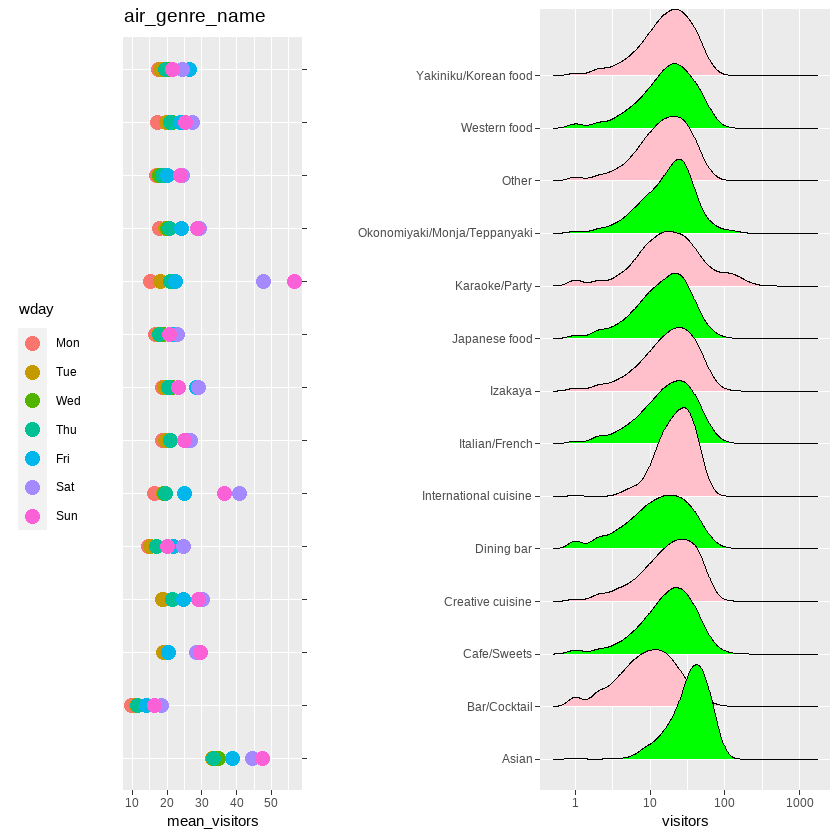

In [66]:
p1 <- full_data %>%
  mutate(wday = wday(visit_date, label = TRUE, week_start = 1)) %>%
  group_by(wday, air_genre_name) %>%
  summarise(mean_visitors = mean(visitors)) %>%
  ggplot(aes(air_genre_name, mean_visitors, color = wday)) +
  geom_point(size = 4) +
  theme(legend.position = "left", axis.text.y = element_blank(),
        plot.title = element_text(size = 14)) +
  coord_flip() +
  labs(x = "") +
  scale_x_discrete(position = "top") +
  ggtitle("air_genre_name") +
  scale_color_hue()

p2 <- full_data %>%
  ggplot(aes(visitors, air_genre_name, fill = air_genre_name)) +
  geom_density_ridges(bandwidth = 0.1) +
  scale_x_log10() +
  theme(legend.position = "none") +
  labs(y = "") +
  scale_fill_cyclical(values = c("green", "pink"))

layout <- matrix(c(1,1,2,2,2),1,5,byrow=TRUE)
multiplot(p1, p2, layout=layout)

Here each colour corresponds to a day of the week. Purple-ish coulours are the weekend, while the cooler colours are the middle of the week. Monday is a red.

We find:

* The biggest difference between weekend and weekdays exists for the “Karaoke” bars, which rule the weekend. A similar trend, although with a considerably smaller gap, can be seen for the “International” cuisine.

* No genre really goes against the trend of busier weekends. The smallest variations are in the generic “Other” category, the “Japanese” food, and also the “Korean” cuisine which is the only category where Fridays are the busiest days. General “Bars/Cocktail” are notably unpopular overall.

* The density curves confirm the impression we got from the week-day distribution: the “Asian” restaurants have rarely less than 10 visitors per date and the “Karaoke” places show a very broad distribution due to the strong impact of the weekends. Note the logarithmic x-axis.

### Days of the week & months of the year with log() transformation

We already looked at the total visitors per week day and month in the beginning of the notebook. Now we will study the log1p transformed visitor numbers. We compute their mean and standard deviation and plot them alongside the (ridgeline) density distributions:


Warning message:
"Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
i Please use `linewidth` instead."


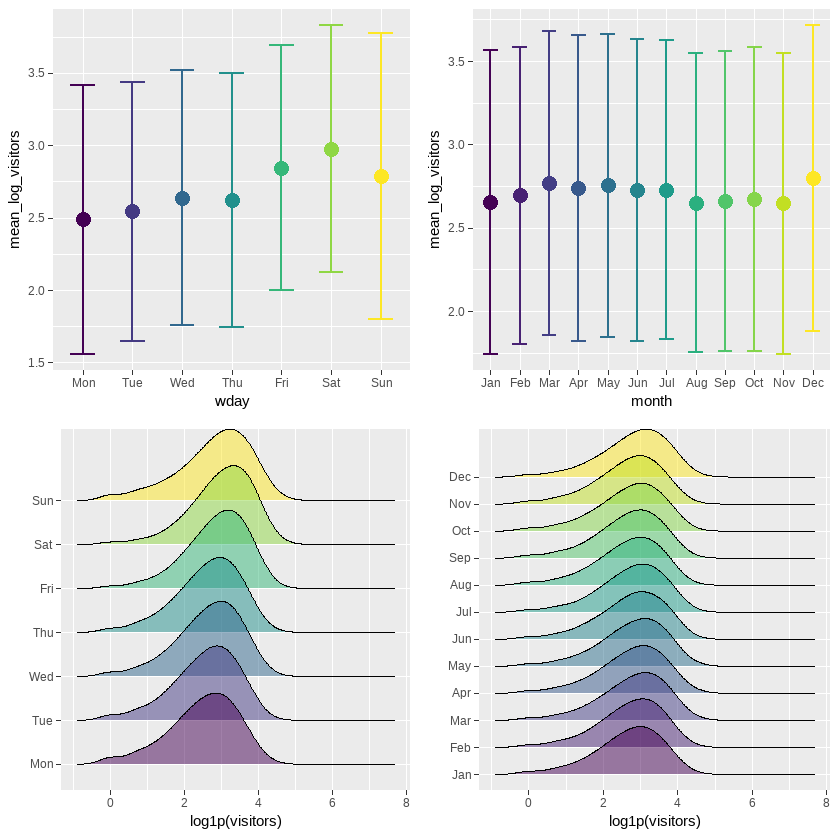

In [67]:
foo <- full_data %>%
  mutate(wday = wday(visit_date, label = TRUE, week_start = 1),month = month(visit_date, label = TRUE))

p1 <- foo %>%
  group_by(wday) %>%
  summarise(mean_log_visitors = mean(log(visitors)),
            sd_log_visitors = sd(log(visitors))) %>%
  ggplot(aes(wday, mean_log_visitors, color = wday)) +
  geom_point(size = 4) +
  geom_errorbar(aes(ymin = mean_log_visitors - sd_log_visitors,
                    ymax = mean_log_visitors + sd_log_visitors,
                    color = wday), width = 0.5, size = 0.7) +
  theme(legend.position = "none")

p2 <- foo %>%
  mutate(visitors = log(visitors)) %>%
  ggplot(aes(visitors, wday, fill = wday)) +
  geom_density_ridges(bandwidth = 0.3, alpha = 0.5) +
  theme(legend.position = "none") +
  labs(x = "log1p(visitors)", y = "")

p3 <- foo %>%
  group_by(month) %>%
  summarise(mean_log_visitors = mean(log(visitors)),
            sd_log_visitors = sd(log(visitors))) %>%
  ggplot(aes(month, mean_log_visitors, color = month)) +
  geom_point(size = 4) +
  geom_errorbar(aes(ymin = mean_log_visitors - sd_log_visitors,
                    ymax = mean_log_visitors + sd_log_visitors,
                    color = month), width = 0.5, size = 0.7) +
  theme(legend.position = "none")

p4 <- foo %>%
  mutate(visitors = log(visitors)) %>%
  ggplot(aes(visitors, month, fill = month)) +
  geom_density_ridges(bandwidth = 0.3, alpha = 0.5) +
  theme(legend.position = "none") +
  labs(x = "log1p(visitors)", y = "")

multiplot(p1, p2, p3, p4, cols = 2)

We find:

* The differences in mean log(visitor) numbers between the days of the week are much smaller than the corresponding uncertainties. This is confirmed by the density plots that show a strong overlap. Still, there is a trend toward higher visitor numbers on the weekend that might be useful.

* The months are even more similar, including the sligthly increased numbers in December. Overall, there is not much difference.

### Here is a breakdown by air_genre_name:

`summarise()` has grouped output by 'wday'. You can override using the
`.groups` argument.


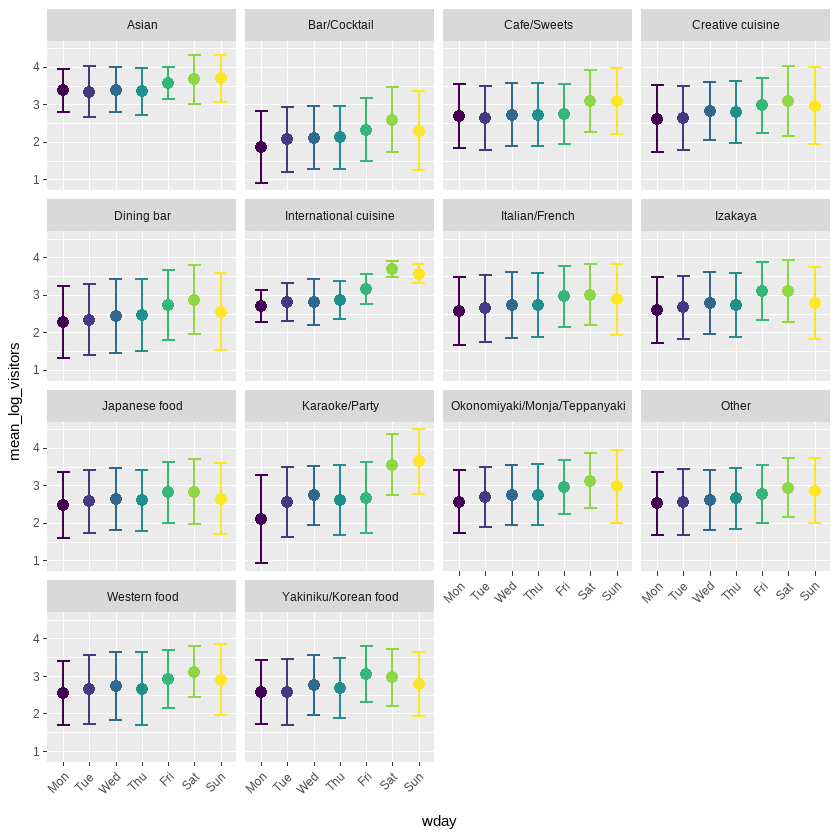

In [68]:
foo %>%
  group_by(wday, air_genre_name) %>%
  summarise(mean_log_visitors = mean(log(visitors)),
            sd_log_visitors = sd(log(visitors))) %>%
  ggplot(aes(wday, mean_log_visitors, color = wday)) +
  geom_point(size = 3) +
  geom_errorbar(aes(ymin = mean_log_visitors - sd_log_visitors,
                    ymax = mean_log_visitors + sd_log_visitors,
                    color = wday), width = 0.5, size = 0.7) +
  theme(legend.position = "none", axis.text.x  = element_text(angle=45, hjust=1, vjust=0.9)) +
  facet_wrap(~ air_genre_name)


We find:

* There is a stronger impact of the weekend vs weekdays for genres such as “Karaoke” or “International Cuisine”, while others show very little change over the days of the week (e.g. “Japanese food”).

* Overall, there is no significant effect for any of the genres on any day of the week.

### 3.2 Restaurants per area and the effect on visitor numbers
let’s study the number of restaurants of a certain genre per area and their impact on visitor numbers.

We begin with an overview plot of the frequency of certain genres per area for air stores. The following count plots show which genres exist in which areas (names truncated). The size of the dots is proportional to the number of cases:

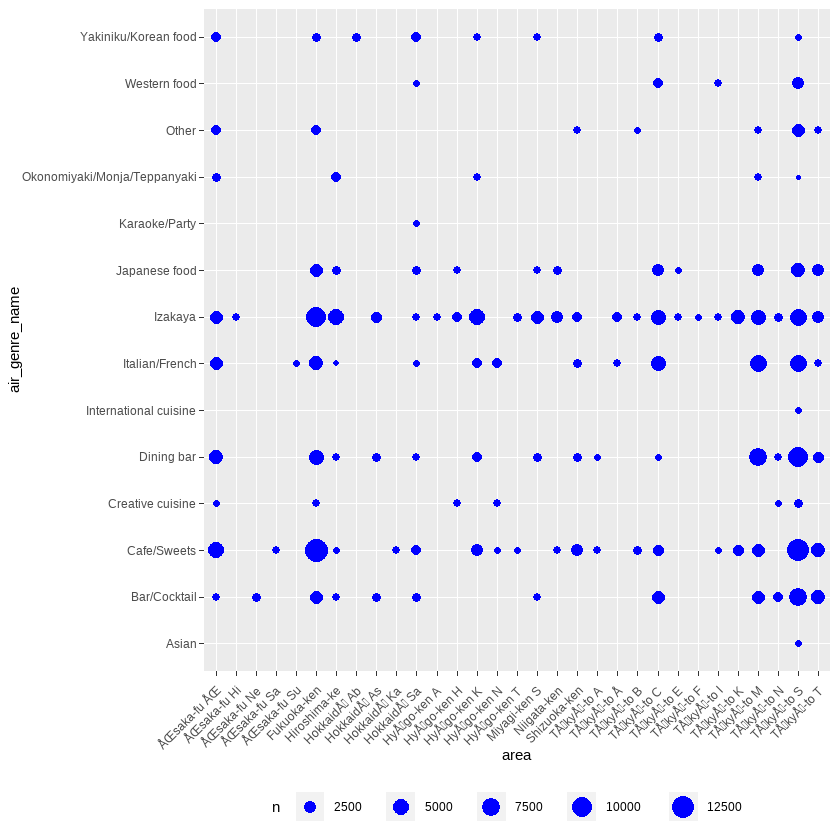

In [69]:
full_data %>%
  mutate(area = str_sub(air_area_name, 1, 12)) %>%
  ggplot(aes(area, air_genre_name)) +
  geom_count(colour = "blue") +
  theme(legend.position = "bottom", axis.text.x  = element_text(angle=45, hjust=1, vjust=0.9))

We find:

* Some areas have lots of restaurants and much variety, whereas others contain only a single air restaurant. Large parts of the parameter space are empty.

* Similarly, some cuisines like “Izakaya” or “Cafe” are pretty ubiqutous, whereas others can only be found in a few areas. Note, that the only Karaoke bars in the air sample are in “Hokkaido Sapporo-shi Minami 3 Jonishi”, whereas the only “International cuisine” restaurants as well as the only two “Asian” places can be found in “Tokyo-to Shibuya-ku Shibuya”.


###  3.3 The impact of holidays

We will study the influence of holidays on our visitor numbers by comparing the statistics for days with holidays vs those without holiday flag:

`summarise()` has grouped output by 'wday'. You can override using the
`.groups` argument.


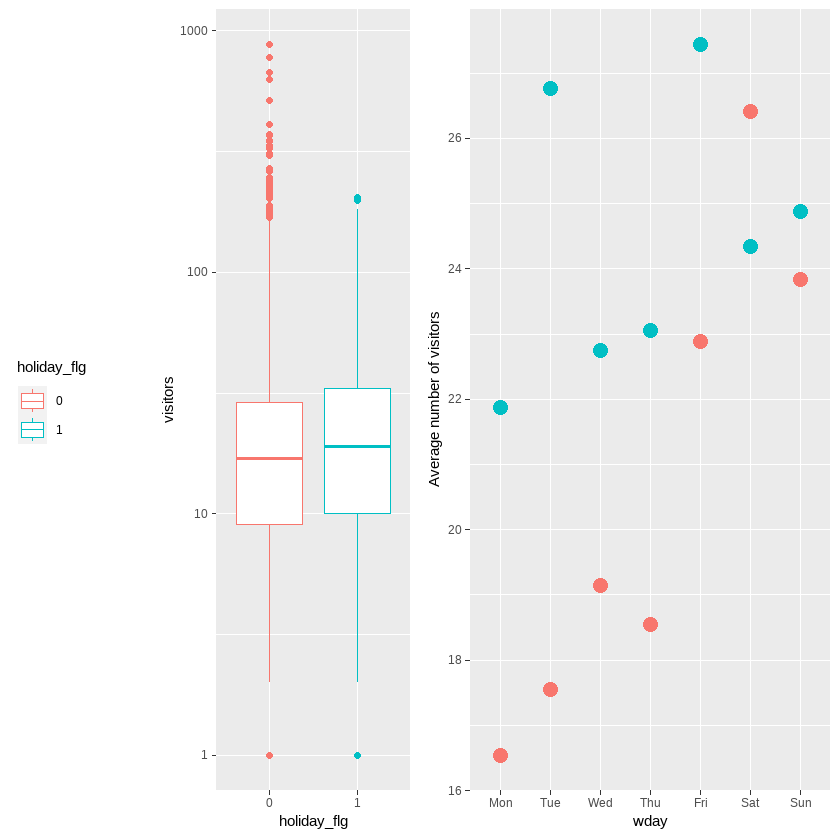

In [70]:
p1 <- full_data %>%
  ggplot(aes(holiday_flg, visitors, color = holiday_flg)) +
  geom_boxplot() +
  scale_y_log10() +
  theme(legend.position = "left")

p2 <- full_data %>%
  mutate(wday = wday(visit_date, label = TRUE, week_start = 1)) %>%
  group_by(wday, holiday_flg) %>%
  summarise(mean_visitors = mean(visitors)) %>%
  ggplot(aes(wday, mean_visitors, color = holiday_flg)) +
  geom_point(size = 4) +
  theme(legend.position = "none") +
  labs(y = "Average number of visitors")

layout <- matrix(c(1,2),1,2,byrow=TRUE)
multiplot(p1, p2, layout=layout)

We find:

* Overall, holidays have a little impact on the average visitor numbers (left panel). As so often, more information is hidden in the details.

* While a weekend holiday has little impact on the visitor numbers, there is a much more pronounced effect for the weekdays; especially Monday and Tuesday (right panel).

In [71]:
head(full_data)

,visit_date,air_store_id,visitors,air_genre_name,air_area_name,latitude,longitude,day_of_week,holiday_flg
,<date>,<fct>,<int>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<fct>
1,2016-01-01,air_b2d8bc9c88b85f96,16,Dining bar,Fukuoka-ken Fukuoka-shi Tenjin,33.59021,130.3977,Friday,1
2,2016-01-01,air_d0a1e69685259c92,7,Creative cuisine,TÅkyÅ-to Shinjuku-ku KabukichÅ,35.69384,139.7035,Friday,1
3,2016-01-01,air_506fe758114df773,4,Italian/French,TÅkyÅ-to Setagaya-ku Setagaya,35.64657,139.6532,Friday,1
4,2016-01-01,air_efc80d3f96b3aff7,10,Other,TÅkyÅ-to Suginami-ku Asagayaminami,35.69957,139.6364,Friday,1
5,2016-01-01,air_d0e8a085d8dc83aa,8,Cafe/Sweets,HyÅgo-ken KÅbe-shi Sumiyoshi Higashimachi,34.72023,135.2655,Friday,1
6,2016-01-01,air_f26f36ec4dc5adb0,64,Izakaya,TÅkyÅ-to Shinjuku-ku KabukichÅ,35.69384,139.7035,Friday,1


###  3.4 Reservations vs Visits
Next we will turn our attention to the reservation numbers in the reserved_data set.We will compare the reservation numbers to the actual visitor numbers. 

**Merge reservations : merge full data with `air_reserved_data_agg`**

In [151]:
#lets copy the full_data to prevent ruining it
copy_full_data <- full_data

In [154]:
head(copy_full_data,1)
head(air_reserved_data,1)

,visit_date,air_store_id,visitors,air_genre_name,air_area_name,latitude,longitude,day_of_week,holiday_flg
,<date>,<fct>,<int>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<fct>
1,2016-01-01,air_b2d8bc9c88b85f96,16,Dining bar,Fukuoka-ken Fukuoka-shi Tenjin,33.59021,130.3977,Friday,1


,air_store_id,visit_datetime,reserve_datetime,reserve_visitors,visit_date
,<chr>,<dttm>,<dttm>,<int>,<date>
1,air_877f79706adbfb06,2016-01-01 19:00:00,2016-01-01 16:00:00,1,2016-01-01


In [159]:
copy_full_data <- merge(copy_full_data, air_reserved_data, by = c("visit_date","air_store_id"), all.x = TRUE) 

In [160]:
str(copy_full_data)

'data.frame':	324849 obs. of  12 variables:
 $ visit_date      : Date, format: "2016-01-01" "2016-01-01" ...
 $ air_store_id    : Factor w/ 829 levels "air_00a91d42b08b08d9",..: 9 13 27 34 84 102 106 119 160 162 ...
 $ visitors        : int  10 29 11 56 6 43 1 12 16 34 ...
 $ air_genre_name  : Factor w/ 14 levels "Asian","Bar/Cocktail",..: 8 8 8 8 2 8 13 3 5 2 ...
 $ air_area_name   : Factor w/ 103 levels "ÅŒsaka-fu ÅŒsaka-shi ÅŒgimachi",..: 81 13 45 25 10 92 89 20 39 61 ...
 $ latitude        : num  35.7 33.6 38.3 33.3 34.8 ...
 $ longitude       : num  140 130 141 131 136 ...
 $ day_of_week     : Factor w/ 7 levels "Friday","Monday",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ holiday_flg     : Factor w/ 2 levels "0","1": 2 2 2 2 2 2 2 2 2 2 ...
 $ visit_datetime  : POSIXct, format: NA NA ...
 $ reserve_datetime: POSIXct, format: NA NA ...
 $ reserve_visitors: int  NA NA NA NA NA NA NA NA NA NA ...


In [161]:
diagnose(copy_full_data)

variables,types,missing_count,missing_percent,unique_count,unique_rate
<chr>,<chr>,<int>,<dbl>,<int>,<dbl>
visit_date,Date,0,0.00000,478,1.471453e-03
air_store_id,factor,0,0.00000,829,2.551955e-03
visitors,integer,0,0.00000,204,6.279841e-04
air_genre_name,factor,0,0.00000,14,4.309695e-05
air_area_name,factor,0,0.00000,103,3.170704e-04
latitude,numeric,0,0.00000,108,3.324622e-04
longitude,numeric,0,0.00000,108,3.324622e-04
day_of_week,factor,0,0.00000,7,2.154847e-05
holiday_flg,factor,0,0.00000,2,6.156707e-06


**We have introduced 66% missing data, we will have to impute data in these NA's**. 
But first, let's try creating another dataset where we inner join the full data with the reservations. Maybe we will use this as the whole dataset.

In [162]:
#this time well do inner join
merged_data <- merge(full_data, air_reserved_data, by = c("visit_date","air_store_id"), all = FALSE) 

In [163]:
str(merged_data)

'data.frame':	108439 obs. of  12 variables:
 $ visit_date      : Date, format: "2016-01-01" "2016-01-01" ...
 $ air_store_id    : Factor w/ 829 levels "air_00a91d42b08b08d9",..: 427 427 712 712 713 713 127 127 127 180 ...
 $ visitors        : int  3 3 21 21 8 8 28 28 28 39 ...
 $ air_genre_name  : Factor w/ 14 levels "Asian","Bar/Cocktail",..: 9 9 5 5 5 5 11 11 11 8 ...
 $ air_area_name   : Factor w/ 103 levels "ÅŒsaka-fu ÅŒsaka-shi ÅŒgimachi",..: 77 77 8 8 31 31 28 28 28 45 ...
 $ latitude        : num  35.7 35.7 34.7 34.7 43.8 ...
 $ longitude       : num  140 140 135 135 142 ...
 $ day_of_week     : Factor w/ 7 levels "Friday","Monday",..: 1 1 1 1 1 1 3 3 3 3 ...
 $ holiday_flg     : Factor w/ 2 levels "0","1": 2 2 2 2 2 2 2 2 2 2 ...
 $ visit_datetime  : POSIXct, format: "2016-01-01 20:00:00" "2016-01-01 19:00:00" ...
 $ reserve_datetime: POSIXct, format: "2016-01-01 16:00:00" "2016-01-01 16:00:00" ...
 $ reserve_visitors: int  2 1 6 3 4 5 2 2 2 2 ...


In [164]:
diagnose(merged_data)

variables,types,missing_count,missing_percent,unique_count,unique_rate
<chr>,<chr>,<int>,<dbl>,<int>,<dbl>
visit_date,Date,0,0,478,4.408008e-03
air_store_id,factor,0,0,331,3.052407e-03
visitors,integer,0,0,162,1.493927e-03
air_genre_name,factor,0,0,14,1.291048e-04
air_area_name,factor,0,0,72,6.639678e-04
latitude,numeric,0,0,74,6.824113e-04
longitude,numeric,0,0,74,6.824113e-04
day_of_week,factor,0,0,7,6.455242e-05
holiday_flg,factor,0,0,2,1.844355e-05


**In this approach I have a smaller dataset with no missing values but the ID's dropped to 331 unique values. This means the models will have less data to learn from. However, I need to predict how many visitors won't show up for the next week, and this means I need to calculate the delta between reserved and actual number of visitors - which means, the reserved_visitors is part of my outcome and I shouldn't impute data on that.**

We will use `merged_data` as the full dataset /flat file.

In [165]:
head(merged_data)

,visit_date,air_store_id,visitors,air_genre_name,air_area_name,latitude,longitude,day_of_week,holiday_flg,visit_datetime,reserve_datetime,reserve_visitors
,<date>,<fct>,<int>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<fct>,<dttm>,<dttm>,<int>
1,2016-01-01,air_877f79706adbfb06,3,Japanese food,TÅkyÅ-to Minato-ku ShibakÅen,35.65807,139.7516,Friday,1,2016-01-01 20:00:00,2016-01-01 16:00:00,2
2,2016-01-01,air_877f79706adbfb06,3,Japanese food,TÅkyÅ-to Minato-ku ShibakÅen,35.65807,139.7516,Friday,1,2016-01-01 19:00:00,2016-01-01 16:00:00,1
3,2016-01-01,air_db4b38ebe7a7ceff,21,Dining bar,ÅŒsaka-fu ÅŒsaka-shi Shinmachi,34.67623,135.4861,Friday,1,2016-01-01 19:00:00,2016-01-01 19:00:00,6
4,2016-01-01,air_db4b38ebe7a7ceff,21,Dining bar,ÅŒsaka-fu ÅŒsaka-shi Shinmachi,34.67623,135.4861,Friday,1,2016-01-01 19:00:00,2016-01-01 19:00:00,3
5,2016-01-01,air_db80363d35f10926,8,Dining bar,HokkaidÅ Asahikawa-shi 6 JÅdÅri,43.77064,142.3648,Friday,1,2016-01-01 19:00:00,2016-01-01 15:00:00,4
6,2016-01-01,air_db80363d35f10926,8,Dining bar,HokkaidÅ Asahikawa-shi 6 JÅdÅri,43.77064,142.3648,Friday,1,2016-01-01 20:00:00,2016-01-01 01:00:00,5


**lets see the correlation between reserved and visited vistors**:

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


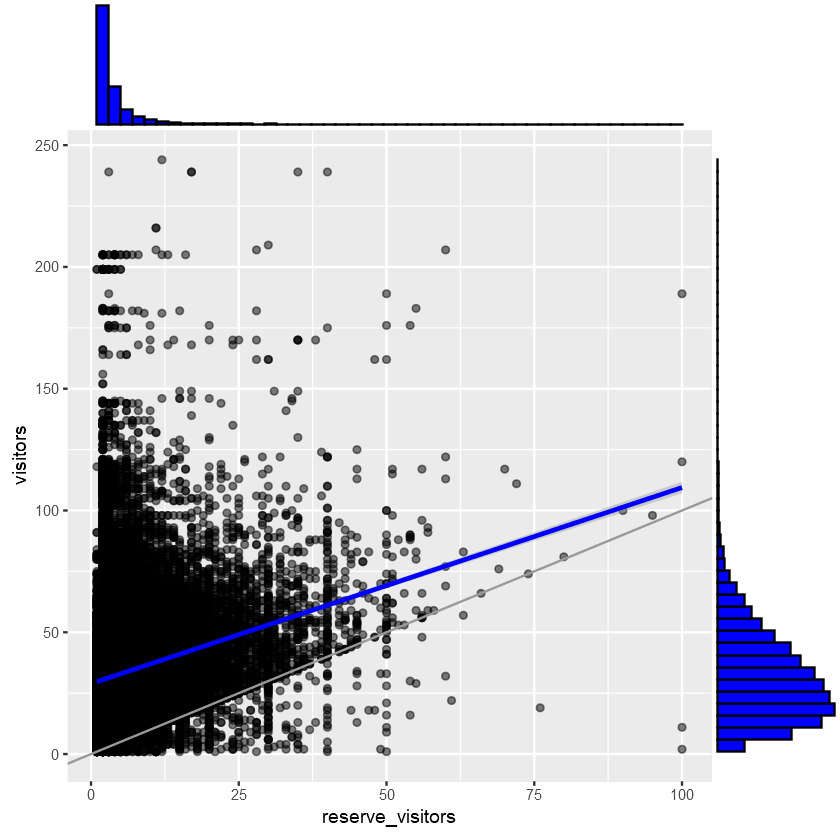

In [166]:
p <- merged_data %>%
  ggplot(aes(reserve_visitors, visitors))+
  geom_point(color = "black", alpha = 0.5) +
  geom_abline(slope = 1, intercept = 0, color = "grey60") +
  geom_smooth(method = "lm", color = "blue")
ggMarginal(p, type="histogram", fill = "blue", bins=50)

We find:

* The histograms show that the reserve_visitors and visitors numbers peak below ~20 and are largely confined to the range below 100.

* The scatter points fall largely above the line of identity, indicating that there were more visitors that day than had reserved a table. This is not surprising, since a certain number of people will always be walk-in customers.

* A notable fraction of the points is below the line, which probably indicates that some people made a reservation but changed their mind and didn’t go. That kind of effect is probably to be expected and taking it into account will be one of the challenges in this competition.

* The linear fit suggests a trend in which larger numbers of reserve_visitors are more likely to underestimate the eventual visitor numbers. This is not surprising either, since I can imagine that it is more likely that (a) a large reservation is cancelled than (b) a large group of people walk in a restaurant without reservation.

Now we will break down the discrepancy between visitors - reserve_visitors over time.
Here, the time series for air (blue) is offset vertically by 150.

Warning message:
"Removed 22 rows containing non-finite values (`stat_bin()`)."
Warning message:
"Removed 2 rows containing missing values (`geom_bar()`)."


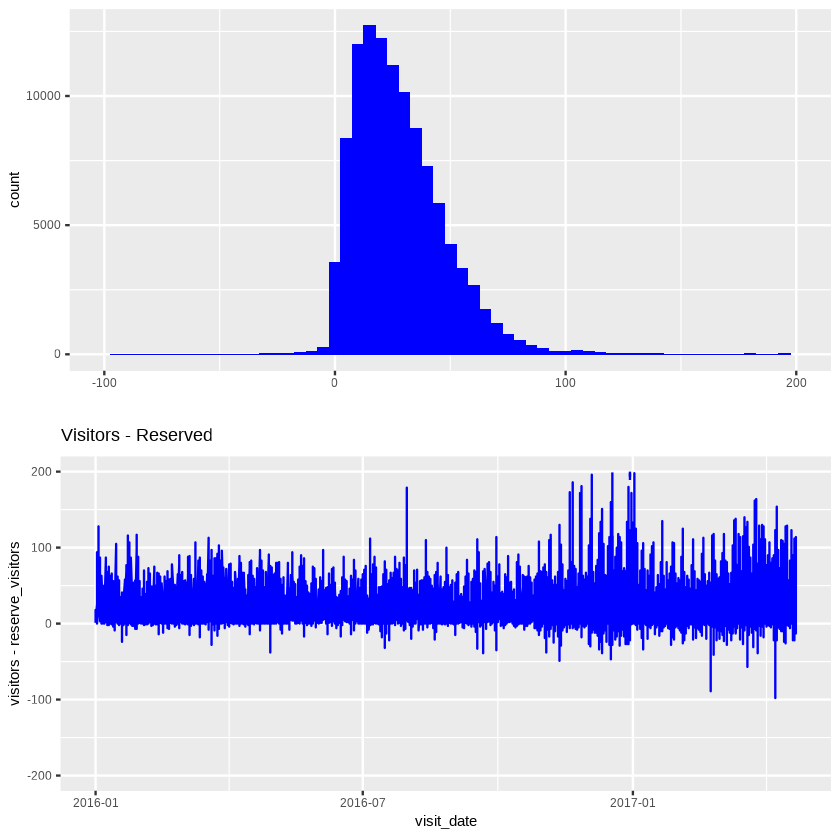

In [169]:
p1 <- merged_data %>%
  ggplot(aes(visitors - reserve_visitors)) +
  geom_histogram(binwidth = 5, fill = "blue") +
  labs(x = "") +
  xlim(-100, 200)


p2 <- merged_data %>%
  ggplot(aes(visit_date, visitors - reserve_visitors)) +
  geom_line(color = "blue") +
  ylim(-200, 200) +
  ggtitle("Visitors - Reserved")

multiplot(p1, p2)

We find:
* The histogram demonstrates how much the distributions are skewed towards larger visitor numbers than reserve_visitor numbers. We might see a mix here between two distributions: a (probably normal) spread due to cancellations plus a tail from walk-in visitors, which should follow a Poisson distribution.

* The time series show significant scatter throughout the training time range. While the curve is predominantly above the baseline (above 0) (i.e. more visitors than reservations)

* The empty space is where there is no reservation data

Warning message:
"Removed 22 rows containing non-finite values (`stat_density()`)."


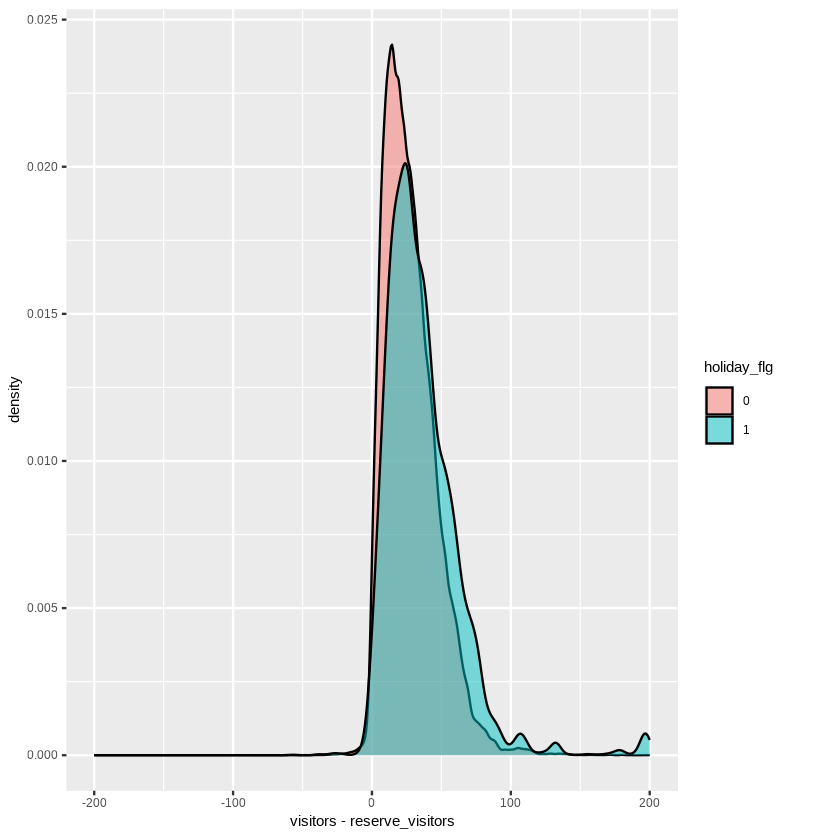

In [170]:
merged_data %>%
  ggplot(aes(visitors - reserve_visitors, fill = holiday_flg)) +
  geom_density(alpha = 0.5) +
  xlim(-200, 200)

There are somewhat higher numbers of visitors compared to reservations on a holiday. The peaks are for holiday ~ 0.029 and non-hilday is ~0.041, but we see small yet clear differences towards larger numbers.

**What about the statistics of visitors vs reservations? Does it depend on the day of the week? We use boxplots to find out:**

Warning message in log(visitors - reserve_visitors):
"NaNs produced"
Warning message in log(visitors - reserve_visitors):
"NaNs produced"
Warning message:
"Removed 2111 rows containing non-finite values (`stat_boxplot()`)."


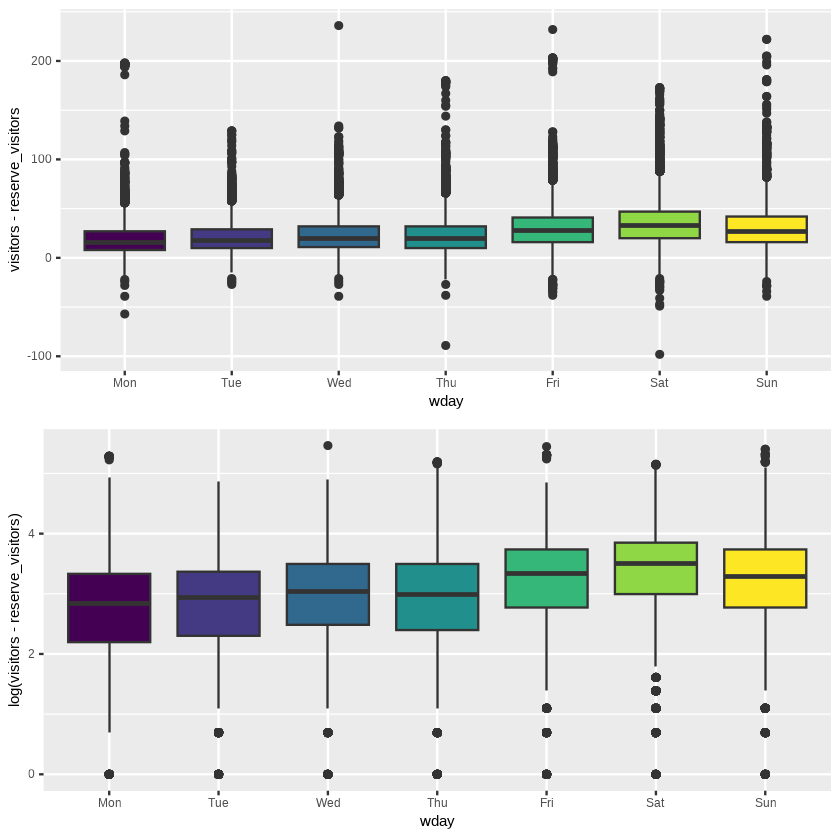

In [171]:
p1 <- merged_data %>%
  mutate(wday = wday(visit_date, label = TRUE, week_start = 1),
        wday = fct_relevel(wday, c("Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"))) %>%
  ggplot(aes(wday, visitors - reserve_visitors, fill = wday)) +
  geom_boxplot() +
  theme(legend.position = "none") 


##with log()
p2 <- merged_data %>%
  mutate(wday = wday(visit_date, label = TRUE, week_start = 1),
        wday = fct_relevel(wday, c("Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"))) %>%
  ggplot(aes(wday, log(visitors - reserve_visitors), fill = wday)) +
  geom_boxplot() +
  theme(legend.position = "none") 


 multiplot(p1,p2)

We see some difference, although we see a slight trend for more visitors compared to reservations on the weekend, especially Sunday.

In [181]:
head(merged_data,2)

,visit_date,air_store_id,visitors,air_genre_name,air_area_name,latitude,longitude,day_of_week,holiday_flg,visit_datetime,reserve_datetime,reserve_visitors
,<date>,<fct>,<int>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<fct>,<dttm>,<dttm>,<int>
1,2016-01-01,air_877f79706adbfb06,3,Japanese food,TÅkyÅ-to Minato-ku ShibakÅen,35.65807,139.7516,Friday,1,2016-01-01 20:00:00,2016-01-01 16:00:00,2
2,2016-01-01,air_877f79706adbfb06,3,Japanese food,TÅkyÅ-to Minato-ku ShibakÅen,35.65807,139.7516,Friday,1,2016-01-01 19:00:00,2016-01-01 16:00:00,1


# FEATURE ENGINEERING

Deriving the time components of the `visit_date` and `reserve_datetime` variables.

In [241]:
#copy the original dataframe to a new dataframe and add month and weeks (i will add new week variable to make it ordinal)
full_data_engineered <- merged_data %>%
  mutate(visit_month = month(visit_date),
         visit_wday = wday(visit_date, label = TRUE, week_start = 1),
         visit_year = year(visit_date),
         visit_day = day(visit_date),
         visit_dayof_year = as.numeric(format(visit_date, "%j")),
         reserve_month = month(reserve_datetime),
         reserve_year = year(reserve_datetime),
         reserve_wday = wday(reserve_datetime),
         reserve_day = day(reserve_datetime),
         reserve_dayof_year = as.numeric(format(visit_date, "%j")))

In [242]:
full_data_engineered$visit_time <- format(full_data_engineered$visit_datetime, format = "%H")
full_data_engineered$reserve_time <- format(full_data_engineered$reserve_datetime, format = "%H")

In [243]:
head(full_data_engineered)

,visit_date,air_store_id,visitors,air_genre_name,air_area_name,latitude,longitude,day_of_week,holiday_flg,visit_datetime,...,visit_year,visit_day,visit_dayof_year,reserve_month,reserve_year,reserve_wday,reserve_day,reserve_dayof_year,visit_time,reserve_time
,<date>,<fct>,<int>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<fct>,<dttm>,...,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>
1,2016-01-01,air_877f79706adbfb06,3,Japanese food,TÅkyÅ-to Minato-ku ShibakÅen,35.65807,139.7516,Friday,1,2016-01-01 20:00:00,...,2016,1,1,1,2016,6,1,1,20,16
2,2016-01-01,air_877f79706adbfb06,3,Japanese food,TÅkyÅ-to Minato-ku ShibakÅen,35.65807,139.7516,Friday,1,2016-01-01 19:00:00,...,2016,1,1,1,2016,6,1,1,19,16
3,2016-01-01,air_db4b38ebe7a7ceff,21,Dining bar,ÅŒsaka-fu ÅŒsaka-shi Shinmachi,34.67623,135.4861,Friday,1,2016-01-01 19:00:00,...,2016,1,1,1,2016,6,1,1,19,19
4,2016-01-01,air_db4b38ebe7a7ceff,21,Dining bar,ÅŒsaka-fu ÅŒsaka-shi Shinmachi,34.67623,135.4861,Friday,1,2016-01-01 19:00:00,...,2016,1,1,1,2016,6,1,1,19,19
5,2016-01-01,air_db80363d35f10926,8,Dining bar,HokkaidÅ Asahikawa-shi 6 JÅdÅri,43.77064,142.3648,Friday,1,2016-01-01 19:00:00,...,2016,1,1,1,2016,6,1,1,19,15
6,2016-01-01,air_db80363d35f10926,8,Dining bar,HokkaidÅ Asahikawa-shi 6 JÅdÅri,43.77064,142.3648,Friday,1,2016-01-01 20:00:00,...,2016,1,1,1,2016,6,1,1,20,01


In [244]:
str(full_data_engineered)

'data.frame':	108439 obs. of  24 variables:
 $ visit_date        : Date, format: "2016-01-01" "2016-01-01" ...
 $ air_store_id      : Factor w/ 829 levels "air_00a91d42b08b08d9",..: 427 427 712 712 713 713 127 127 127 180 ...
 $ visitors          : int  3 3 21 21 8 8 28 28 28 39 ...
 $ air_genre_name    : Factor w/ 14 levels "Asian","Bar/Cocktail",..: 9 9 5 5 5 5 11 11 11 8 ...
 $ air_area_name     : Factor w/ 103 levels "ÅŒsaka-fu ÅŒsaka-shi ÅŒgimachi",..: 77 77 8 8 31 31 28 28 28 45 ...
 $ latitude          : num  35.7 35.7 34.7 34.7 43.8 ...
 $ longitude         : num  140 140 135 135 142 ...
 $ day_of_week       : Factor w/ 7 levels "Friday","Monday",..: 1 1 1 1 1 1 3 3 3 3 ...
 $ holiday_flg       : Factor w/ 2 levels "0","1": 2 2 2 2 2 2 2 2 2 2 ...
 $ visit_datetime    : POSIXct, format: "2016-01-01 20:00:00" "2016-01-01 19:00:00" ...
 $ reserve_datetime  : POSIXct, format: "2016-01-01 16:00:00" "2016-01-01 16:00:00" ...
 $ reserve_visitors  : int  2 1 6 3 4 5 2 2 2 2 ...
 $ vis

In [245]:
#lets delete day of week from date_info table:
full_data_engineered <- full_data_engineered %>% select (-day_of_week)

Calcuating the time difference between the reservation and the visit, we will call this `hours_diff`:

In [246]:
full_data_engineered$hours_diff <- as.numeric(difftime(full_data_engineered$visit_datetime, full_data_engineered$reserve_datetime, units = "hours"))

In [247]:
head(full_data_engineered)

,visit_date,air_store_id,visitors,air_genre_name,air_area_name,latitude,longitude,holiday_flg,visit_datetime,reserve_datetime,...,visit_day,visit_dayof_year,reserve_month,reserve_year,reserve_wday,reserve_day,reserve_dayof_year,visit_time,reserve_time,hours_diff
,<date>,<fct>,<int>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<dttm>,<dttm>,...,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>,<dbl>
1,2016-01-01,air_877f79706adbfb06,3,Japanese food,TÅkyÅ-to Minato-ku ShibakÅen,35.65807,139.7516,1,2016-01-01 20:00:00,2016-01-01 16:00:00,...,1,1,1,2016,6,1,1,20,16,4
2,2016-01-01,air_877f79706adbfb06,3,Japanese food,TÅkyÅ-to Minato-ku ShibakÅen,35.65807,139.7516,1,2016-01-01 19:00:00,2016-01-01 16:00:00,...,1,1,1,2016,6,1,1,19,16,3
3,2016-01-01,air_db4b38ebe7a7ceff,21,Dining bar,ÅŒsaka-fu ÅŒsaka-shi Shinmachi,34.67623,135.4861,1,2016-01-01 19:00:00,2016-01-01 19:00:00,...,1,1,1,2016,6,1,1,19,19,0
4,2016-01-01,air_db4b38ebe7a7ceff,21,Dining bar,ÅŒsaka-fu ÅŒsaka-shi Shinmachi,34.67623,135.4861,1,2016-01-01 19:00:00,2016-01-01 19:00:00,...,1,1,1,2016,6,1,1,19,19,0
5,2016-01-01,air_db80363d35f10926,8,Dining bar,HokkaidÅ Asahikawa-shi 6 JÅdÅri,43.77064,142.3648,1,2016-01-01 19:00:00,2016-01-01 15:00:00,...,1,1,1,2016,6,1,1,19,15,4
6,2016-01-01,air_db80363d35f10926,8,Dining bar,HokkaidÅ Asahikawa-shi 6 JÅdÅri,43.77064,142.3648,1,2016-01-01 20:00:00,2016-01-01 01:00:00,...,1,1,1,2016,6,1,1,20,01,19


####  Deriving restaurants per area - `air_count`
This feature will address the question of how many restaurants can be found in a certain area and whether larger numbers of restaurants per area affect the average visitor numbers.

In order to compute it, we simply count the number of air restaurants for the corresponding areas. We show the resulting distributions in the next plot at the top. Then we estimate the mean log1p-transformed visitor count per restaurant, and then compute the mean and standard deviation of this number for each area count group.


#### Deriving distance from the busiest area - `dist`
Whenever we have spatial coordinates in our data we automatically also have the distances between these coordinates. As a first approximation we use the linear distance between two points.

To compute these distances we are using the distCosine function of the geosphere package for spherical trigonometry. This method gives us the shortest distance between two points on a spherical earth.

#### Deriving prefectures - `prefecture`

This is a straight-forward feature where we simply define the prefecture as the first part of the `area_name`. Here we make use of the (generally) consistent formatting of the area name. This gives us a relatively small number of distinct high-level areas: 


In [248]:
# count stores in area
air_count <- full_data_engineered %>%
  group_by(air_area_name) %>%
  summarise(air_count = n())

# distances (calculates the median of two variables (longitude and latitude))
med_coord_air <- full_data_engineered %>% #this will be our reference point to calculate the distance (dist)
  summarise_at(vars(longitude:latitude), median)

air_coords <- full_data_engineered %>%
  select(longitude,latitude)

full_data_engineered$dist <- distCosine(air_coords, med_coord_air)/1e3
#The calculated distances are divided by 1e3, which converts the distances from meters to kilometers.

# apply counts, dist; add prefecture
full_data_engineered <- full_data_engineered %>%
  mutate(dist_group = as.integer(case_when(
    dist < 80 ~ 1,
    dist < 300 ~ 2,
    dist < 500 ~ 3,
    dist < 750 ~ 4,
    TRUE ~ 5))) %>%
  left_join(air_count, by = "air_area_name") %>%
  separate(air_area_name, c("prefecture"), sep = " ", remove = FALSE)

Warning message:
"Expected 1 pieces. Additional pieces discarded in 108439 rows [1, 2, 3, 4, 5,
6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, ...]."


In [249]:
head(full_data_engineered)

,visit_date,air_store_id,visitors,air_genre_name,air_area_name,prefecture,latitude,longitude,holiday_flg,visit_datetime,...,reserve_year,reserve_wday,reserve_day,reserve_dayof_year,visit_time,reserve_time,hours_diff,dist,dist_group,air_count
,<date>,<fct>,<int>,<fct>,<fct>,<chr>,<dbl>,<dbl>,<fct>,<dttm>,...,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>
1,2016-01-01,air_877f79706adbfb06,3,Japanese food,TÅkyÅ-to Minato-ku ShibakÅen,TÅkyÅ-to,35.65807,139.7516,1,2016-01-01 20:00:00,...,2016,6,1,1,20,16,4,64.78431,1,3438
2,2016-01-01,air_877f79706adbfb06,3,Japanese food,TÅkyÅ-to Minato-ku ShibakÅen,TÅkyÅ-to,35.65807,139.7516,1,2016-01-01 19:00:00,...,2016,6,1,1,19,16,3,64.78431,1,3438
3,2016-01-01,air_db4b38ebe7a7ceff,21,Dining bar,ÅŒsaka-fu ÅŒsaka-shi Shinmachi,ÅŒsaka-fu,34.67623,135.4861,1,2016-01-01 19:00:00,...,2016,6,1,1,19,19,0,340.08986,3,1292
4,2016-01-01,air_db4b38ebe7a7ceff,21,Dining bar,ÅŒsaka-fu ÅŒsaka-shi Shinmachi,ÅŒsaka-fu,34.67623,135.4861,1,2016-01-01 19:00:00,...,2016,6,1,1,19,19,0,340.08986,3,1292
5,2016-01-01,air_db80363d35f10926,8,Dining bar,HokkaidÅ Asahikawa-shi 6 JÅdÅri,HokkaidÅ,43.77064,142.3648,1,2016-01-01 19:00:00,...,2016,6,1,1,19,15,4,949.81556,5,4937
6,2016-01-01,air_db80363d35f10926,8,Dining bar,HokkaidÅ Asahikawa-shi 6 JÅdÅri,HokkaidÅ,43.77064,142.3648,1,2016-01-01 20:00:00,...,2016,6,1,1,20,01,19,949.81556,5,4937


# EDA on new features:

Lets estimate the mean visitor count per restaurant, and then compute the mean and standard deviation of this number for each area count group:

`summarise()` has grouped output by 'air_store_id'. You can override using the
`.groups` argument.
`geom_smooth()` using formula = 'y ~ x'


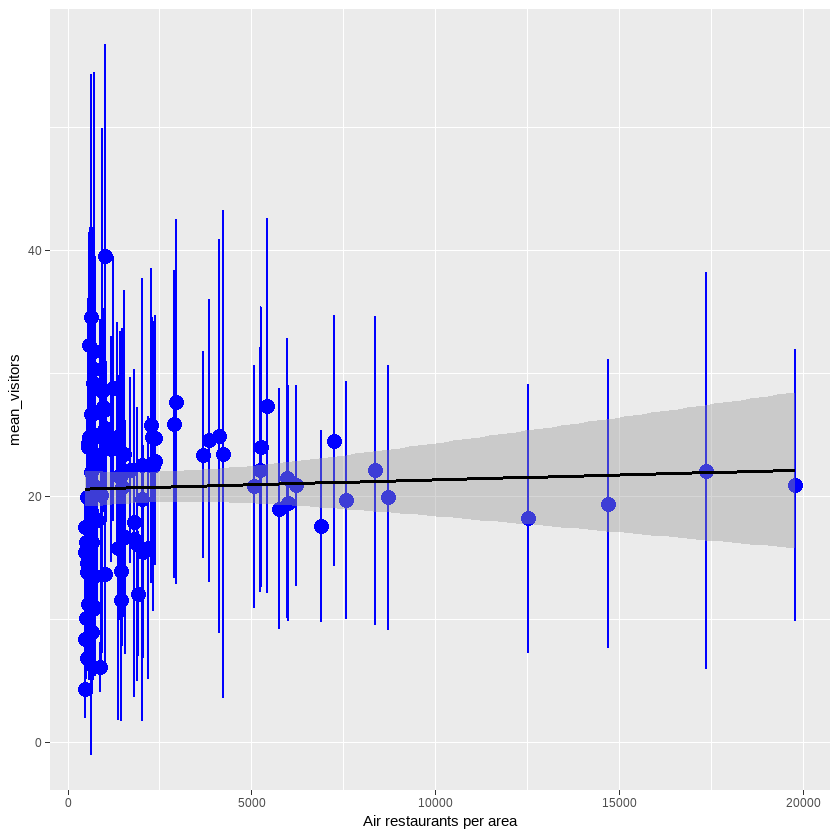

In [94]:
p3 <- full_data_engineered %>%
  group_by(air_store_id, air_count) %>%
  summarise(mean_store_visit = mean(visitors)) %>%
  group_by(air_count) %>%
  summarise(mean_visitors = mean(mean_store_visit),
            sd_visitors = sd(mean_store_visit)) %>%
  ggplot(aes(air_count, mean_visitors)) +
  geom_point(size = 4, color = "blue") +
  geom_errorbar(aes(ymin = mean_visitors - sd_visitors,
                    ymax = mean_visitors + sd_visitors),
                    color = "blue", width = 0.5, size = 0.7) +
  geom_smooth(method = "lm", color = "black") +
  labs(x = "Air restaurants per area")

p3

We find:
* There are 4 areas with more than 10,000 restaurants
* The mean visitor numbers per area have large uncertainties and are all consistent with each other. There is a slight trend, shown by the black linear regression, toward lower average numbers for larger areas but it is quite weak.

Here, we plot the histograms of the distances from the medians for all the restaurants in the air data. These distributions will suggest a grouping into 5 different bins with ranges of increasing distance. We then compute the mean log1p visitor numbers for the 5 groups and compare them:

`summarise()` has grouped output by 'air_store_id'. You can override using the
`.groups` argument.


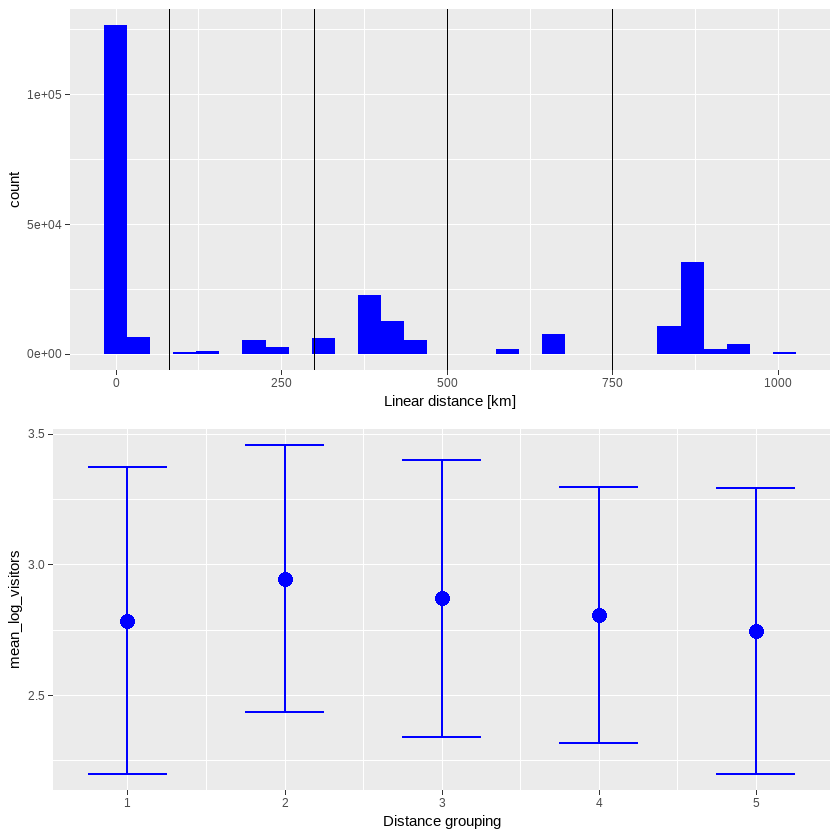

In [95]:
### Distance from the bussiest area
p1 <- full_data_engineered %>%
  ggplot(aes(dist)) +
  geom_histogram(bins = 30, fill = "blue") +
  geom_vline(xintercept = c(80, 300, 500, 750)) +
  labs(x = "Linear distance [km]")

p3 <- full_data_engineered %>%
  group_by(air_store_id, dist_group) %>%
  summarise(mean_store_visit = mean(log1p(visitors))) %>%
  group_by(dist_group) %>%
  summarise(mean_log_visitors = mean(mean_store_visit),
            sd_log_visitors = sd(mean_store_visit)) %>%
  ggplot(aes(dist_group, mean_log_visitors)) +
  geom_point(size = 4, color = "blue") +
  geom_errorbar(aes(ymin = mean_log_visitors - sd_log_visitors,
                    ymax = mean_log_visitors + sd_log_visitors),
                    color = "blue", width = 0.5, size = 0.7) +
  labs(x = "Distance grouping")
  

multiplot(p1, p3)

We find:

* The distance distribution has a clear peak at very short values; which is to be expected since our reference is the median. We also see further peaks, most prominently around ~450 km and ~800 km. These will correspond to (groups of) cities and are consistent between the air data. We define 5 distance bins based on the vertical black lines at 80, 300, 500, and 750 km.

* The mean log1p-transformed visitor counts for these 5 distance bins show no significant differences within their standard deviations.

prefectures:

`summarise()` has grouped output by 'air_store_id'. You can override using the
`.groups` argument.


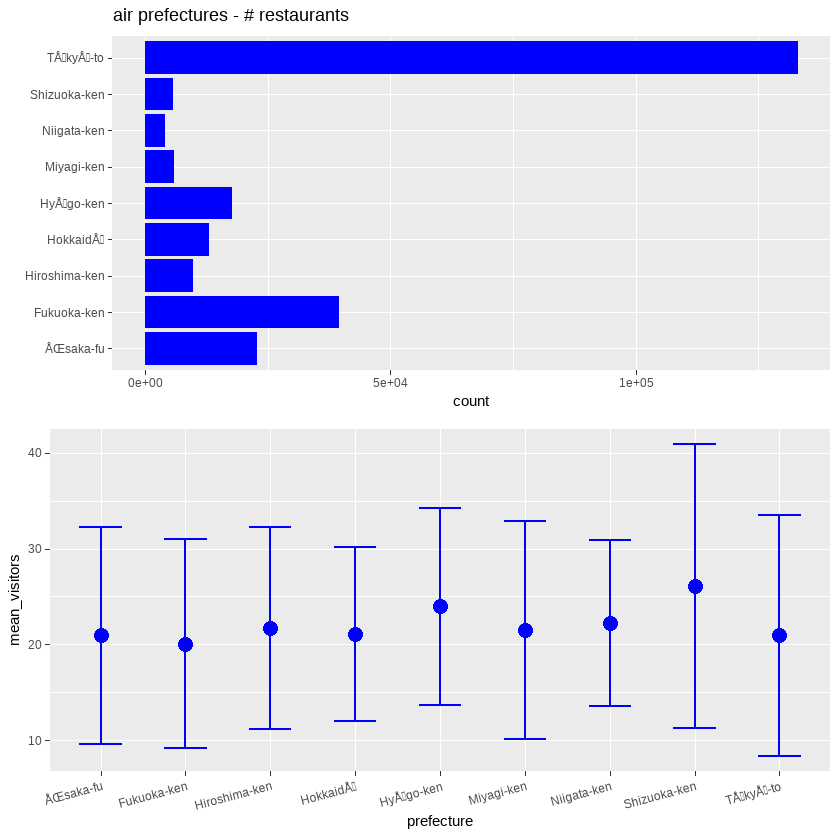

In [96]:
p1 <- full_data_engineered %>%
  ggplot(aes(prefecture)) +
  geom_bar(fill = "blue") +
  coord_flip() +
  ggtitle("air prefectures - # restaurants") +
  labs(x = "")


p3 <- full_data_engineered %>%
  group_by(air_store_id, prefecture) %>%
  summarise(mean_store_visit = mean(visitors)) %>%
  group_by(prefecture) %>%
  summarise(mean_visitors = mean(mean_store_visit),
            sd_visitors = sd(mean_store_visit)) %>%
  ggplot(aes(prefecture, mean_visitors)) +
  geom_point(size = 4, color = "blue") +
  geom_errorbar(aes(ymin = mean_visitors - sd_visitors,
                    ymax = mean_visitors + sd_visitors),
                    color = "blue", width = 0.5, size = 0.7) +
  labs(x = "prefecture") +
  theme(axis.text.x  = element_text(angle=15, hjust=1, vjust=0.9))

multiplot(p1, p3, cols =1 )

We find:

* There are 9 prefectures in the air data where “Tokyo” is clearly the most frequent entry, following Fukuoka

* Once more, we don’t see signficant differences in the mean log1p visitor numbers for the 9 different air prefectures. Any possible variation is smaller than the size of the error bars.

**Time difference between reservation and the visit date**

Warning message in geom_histogram(stat = "count", color = "black", fill = "blue"):
"Ignoring unknown parameters: `binwidth`, `bins`, and `pad`"


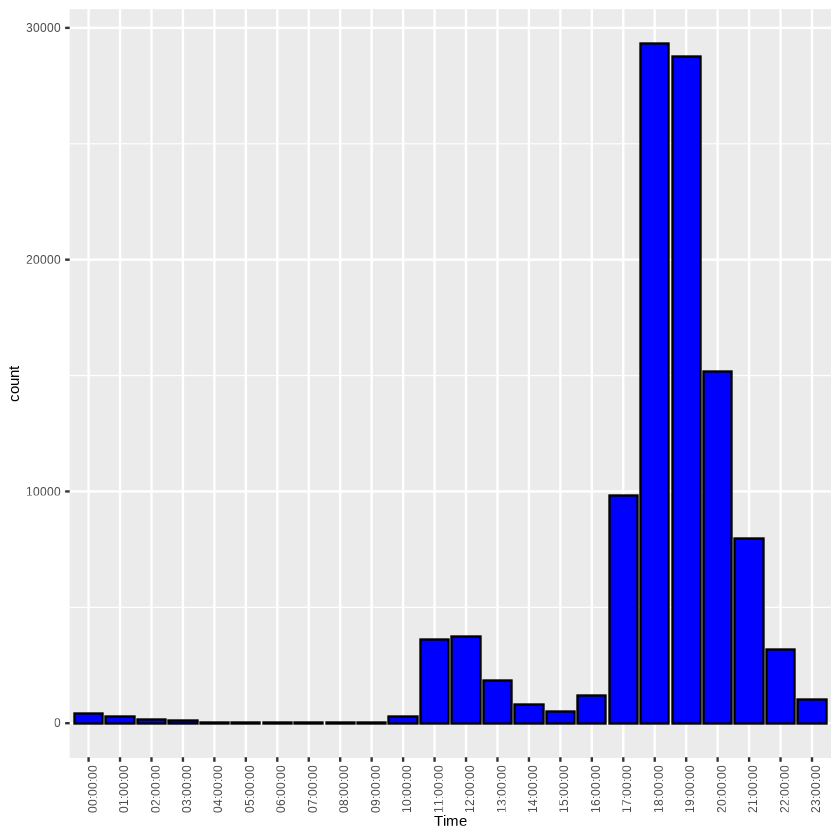

In [220]:
p1 <- full_data_engineered %>%
  ggplot(aes(x = visit_time)) +
  geom_histogram(stat="count",color="black", fill="blue") +
  labs(x = "Time") +
  theme(axis.text.x = element_text(angle = 90, hjust = 1))
p1     

We can see that most of the reservation are for evensing, the peak is at 18:00.

In [250]:
summary(full_data_engineered$hours_diff)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    0.0     8.0    54.0   166.4   184.5  9435.0 

The mean between reservation and the visit is 54 hours (~2 days), the median is 166 hours (7 days) and the Max is 9435 (more than a year!). **We will check if this is a mistake or a very imporant day and the restaurant is very famous**

In [251]:
#order the column by a date:
full_data_engineered <- full_data_engineered[order(full_data_engineered$visit_date),]

In [272]:
head(full_data_engineered)

,visit_date,air_store_id,visitors,air_genre_name,air_area_name,prefecture,latitude,longitude,holiday_flg,visit_datetime,...,reserve_year,reserve_wday,reserve_day,reserve_dayof_year,visit_time,reserve_time,hours_diff,dist,dist_group,air_count
,<date>,<fct>,<int>,<fct>,<fct>,<chr>,<dbl>,<dbl>,<fct>,<dttm>,...,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>
1,2016-01-01,air_877f79706adbfb06,3,Japanese food,TÅkyÅ-to Minato-ku ShibakÅen,TÅkyÅ-to,35.65807,139.7516,1,2016-01-01 20:00:00,...,2016,6,1,1,20,16,4,64.78431,1,3438
2,2016-01-01,air_877f79706adbfb06,3,Japanese food,TÅkyÅ-to Minato-ku ShibakÅen,TÅkyÅ-to,35.65807,139.7516,1,2016-01-01 19:00:00,...,2016,6,1,1,19,16,3,64.78431,1,3438
3,2016-01-01,air_db4b38ebe7a7ceff,21,Dining bar,ÅŒsaka-fu ÅŒsaka-shi Shinmachi,ÅŒsaka-fu,34.67623,135.4861,1,2016-01-01 19:00:00,...,2016,6,1,1,19,19,0,340.08986,3,1292
4,2016-01-01,air_db4b38ebe7a7ceff,21,Dining bar,ÅŒsaka-fu ÅŒsaka-shi Shinmachi,ÅŒsaka-fu,34.67623,135.4861,1,2016-01-01 19:00:00,...,2016,6,1,1,19,19,0,340.08986,3,1292
5,2016-01-01,air_db80363d35f10926,8,Dining bar,HokkaidÅ Asahikawa-shi 6 JÅdÅri,HokkaidÅ,43.77064,142.3648,1,2016-01-01 19:00:00,...,2016,6,1,1,19,15,4,949.81556,5,4937
6,2016-01-01,air_db80363d35f10926,8,Dining bar,HokkaidÅ Asahikawa-shi 6 JÅdÅri,HokkaidÅ,43.77064,142.3648,1,2016-01-01 20:00:00,...,2016,6,1,1,20,01,19,949.81556,5,4937


In [273]:
str(full_data_engineered)

'data.frame':	108439 obs. of  28 variables:
 $ visit_date        : Date, format: "2016-01-01" "2016-01-01" ...
 $ air_store_id      : Factor w/ 829 levels "air_00a91d42b08b08d9",..: 427 427 712 712 713 713 127 127 127 180 ...
 $ visitors          : int  3 3 21 21 8 8 28 28 28 39 ...
 $ air_genre_name    : Factor w/ 14 levels "Asian","Bar/Cocktail",..: 9 9 5 5 5 5 11 11 11 8 ...
 $ air_area_name     : Factor w/ 103 levels "ÅŒsaka-fu ÅŒsaka-shi ÅŒgimachi",..: 77 77 8 8 31 31 28 28 28 45 ...
 $ prefecture        : chr  "TÅ\215kyÅ\215-to" "TÅ\215kyÅ\215-to" "ÅŒsaka-fu" "ÅŒsaka-fu" ...
 $ latitude          : num  35.7 35.7 34.7 34.7 43.8 ...
 $ longitude         : num  140 140 135 135 142 ...
 $ holiday_flg       : Factor w/ 2 levels "0","1": 2 2 2 2 2 2 2 2 2 2 ...
 $ visit_datetime    : POSIXct, format: "2016-01-01 20:00:00" "2016-01-01 19:00:00" ...
 $ reserve_datetime  : POSIXct, format: "2016-01-01 16:00:00" "2016-01-01 16:00:00" ...
 $ reserve_visitors  : int  2 1 6 3 4 5 2 2 2 2 ...


In [274]:
diagnose(full_data_engineered)

variables,types,missing_count,missing_percent,unique_count,unique_rate
<chr>,<chr>,<int>,<dbl>,<int>,<dbl>
visit_date,Date,0,0,478,4.408008e-03
air_store_id,factor,0,0,331,3.052407e-03
visitors,integer,0,0,162,1.493927e-03
air_genre_name,factor,0,0,14,1.291048e-04
air_area_name,factor,0,0,72,6.639678e-04
prefecture,character,0,0,9,8.299597e-05
latitude,numeric,0,0,74,6.824113e-04
longitude,numeric,0,0,74,6.824113e-04
holiday_flg,factor,0,0,2,1.844355e-05


In [276]:
#export the full data:
write.csv(full_data_engineered, "C:/Users/stein/Documents/DataScience/Restaurant_Project/data/full_data_engineered.csv", row.names=FALSE)


### End of notebook
We have finished all the step from data import to feature engineeing. The next steps of feature selection, data partitioning, modelling and evaluating will be done in another notebook in Python language.